### Необходимык библиотеки

In [2]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

%config InlineBackend.figure_format = 'retina'
sns.set_style('darkgrid')
sns.set(rc={'figure.figsize':(20, 12)})

In [3]:
%%html
<style>
.cell-output-ipywidget-background {
    background-color: transparent !important;
}
:root {
    --jp-widgets-color: var(--vscode-editor-foreground);
    --jp-widgets-font-size: var(--vscode-editor-font-size);
}
</style>

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

%cd /content/drive/MyDrive/Colab Notebooks/Диплом
%ls

Mounted at /content/drive/
/content/drive/MyDrive/Colab Notebooks/Диплом
 bank_index.xlsx   date_count.xlsx   news_result.xlsx        'Новости коммераснат.xlsx'
 bert_macro.xlsx   mapper.xlsx       NPS_embed.ipynb
 bert_micro.xlsx   news_count.xlsx   preprocessed_news.xlsx
 bert_news.xlsx    News_emb.ipynb    комментарии_банки.xlsx


### Подготавливаем данные

In [4]:
comments_raw_data = pd.read_excel('Новости коммераснат.xlsx')

comments_raw_data['datetime'] = pd.to_datetime(comments_raw_data['datetime'], format='%d.%m.%Y, %H:%M')
comments_raw_data = comments_raw_data.drop(columns=['Unnamed: 0'])

In [5]:
comments_raw_data = comments_raw_data[comments_raw_data['bank'] != 'Банк Россия']

### Cтатистики

In [ ]:
min_ = comments_raw_data["datetime"].min().date()
max_ = comments_raw_data["datetime"].max().date()
print(f'min: {min_} \nmax: {max_}')

min: 2020-01-09 
max: 2023-12-01


In [ ]:
bank_counts = np.unique(comments_raw_data['bank'], return_counts=True)
popularity = sorted(list(zip(bank_counts[0], bank_counts[1])), key=lambda x:x[1], reverse=True)

In [ ]:
top_pop = -1
bank_set_ = popularity[:top_pop] #возьмем первык n банков
bank_set = [x[0] for x in bank_set_]

In [ ]:
pd.DataFrame({'date' : np.unique(comments_raw_data['datetime'].dt.strftime('%Y-%m').dropna(), return_counts=True)[0],
              'count' : np.unique(comments_raw_data['datetime'].dt.strftime('%Y-%m').dropna(), return_counts=True)[1]}).to_excel('date_count.xlsx')

<Axes: xlabel='datetime', ylabel='Count'>

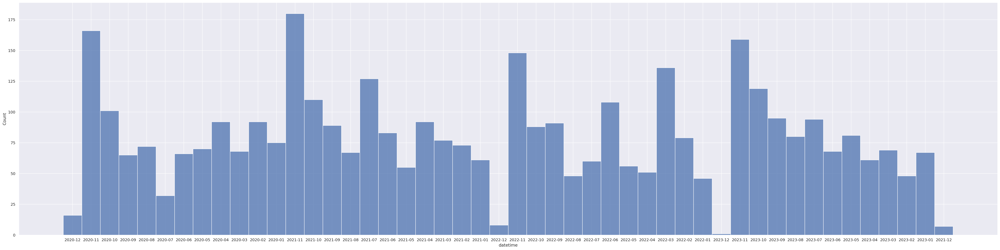

In [ ]:
sns.set(rc={'figure.figsize':(50, 12)})
sns.histplot(comments_raw_data['datetime'].dt.strftime('%Y-%m').dropna(), bins=10)

Text(0.5, 1.0, 'Кол-во статей с упоминаний c 2020-01-09 по 2023-12-01')

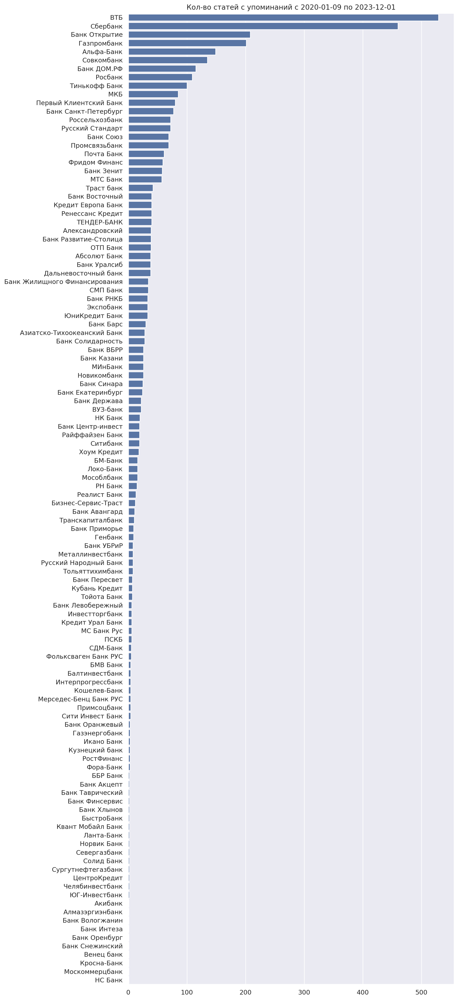

In [ ]:
sns.set(rc={'figure.figsize':(10, 30)})

names = [x[0] for x in bank_set_]
counts = [x[1] for x in bank_set_]

pd.DataFrame({'bank':names, 'count':counts}).to_excel('news_count.xlsx')

sns.barplot(x=counts, y=names).set_title(f'Кол-во статей с упоминаний c {min_} по {max_}')

In [6]:
from wordcloud import WordCloud

In [7]:
def draw_cloud(data):
    wc = WordCloud(background_color='white', max_words=1000,
                  width=1000, height=500, colormap='ocean')
    texts = data.astype(str)
    joint_text = ' '.join(list(texts))
    wc.generate(joint_text)
    return wc.to_image()

### Обработка текстов

In [8]:
data = comments_raw_data.dropna()[['paper_text', 'bank', 'datetime']]

In [9]:
data['year'] = data['datetime'].dt.year

In [10]:
import nltk
nltk.download("stopwords")

from nltk.corpus import stopwords
from pymystem3 import Mystem
from string import punctuation
from nltk.stem.snowball import SnowballStemmer

stemmer = SnowballStemmer("russian")
mystem = Mystem()
russian_stopwords = stopwords.words("russian")

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/ilgarmamedov/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [11]:
extended_punctuation = punctuation+'«'+'»'+'“'+'”'
digits = '0123456789'

def preprocess_text(text, transform, stemmer=stemmer, mystem=mystem, russian_stopwords=russian_stopwords, punctuation=extended_punctuation, digits=digits):
    text = text.lower()
    for i in punctuation:
      text = text.replace(i, '')

    for i in digits:
      text = text.replace(i, '')

    if transform == 'stemming':
        tokens = mystem.lemmatize(text)

    if transform == 'lemmatizing':
        tokens = [stemmer.stem(word) for word in text.split()]

    if transform is None:
        tokens = [word for word in text.split()]

    tokens = [token for token in tokens if token not in russian_stopwords\
              and token != " "]

    text = " ".join(tokens).strip()
    return text

In [12]:
pip install pandarallel

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.3.2 -> 24.0
[notice] To update, run: /Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [13]:
from tqdm import tqdm
tqdm.pandas()

from pandarallel import pandarallel
pandarallel.initialize(progress_bar=True)

INFO: Pandarallel will run on 12 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.


In [15]:
data['paper_stemming_text'] = data['paper_text'].parallel_apply(lambda x: preprocess_text(str(x), transform='stemming'))

In [16]:
data['paper_lemmatizing_text'] = data['paper_text'].parallel_apply(lambda x: preprocess_text(str(x), transform='lemmatizing'))

In [17]:
suptitle_data = comments_raw_data[['datetime', 'suptitle']].dropna()

suptitle_data['suptitle'] = suptitle_data['suptitle'].parallel_apply(lambda x: preprocess_text(str(x), transform=None))
suptitle_data['datetime'] = suptitle_data['datetime'].dt.year

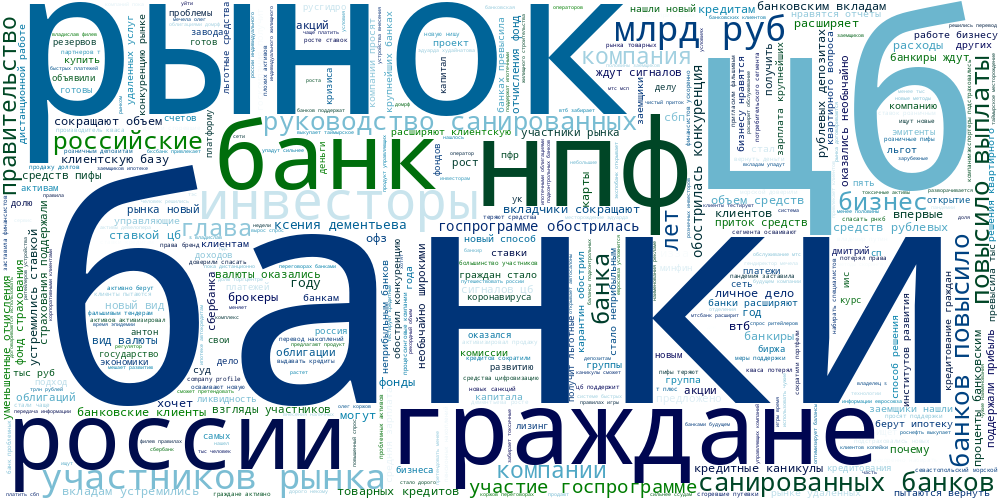

In [ ]:
text = suptitle_data[suptitle_data['datetime'] == 2020]['suptitle']
draw_cloud(text)

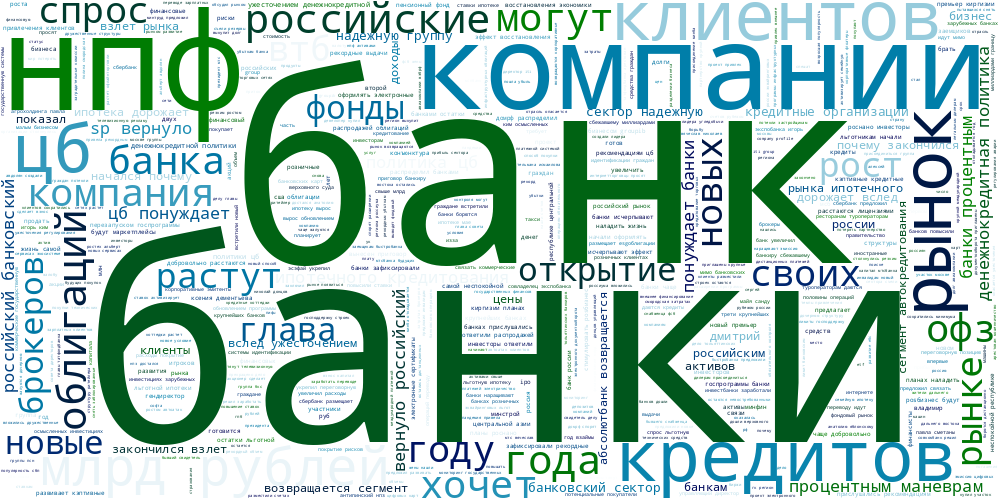

In [ ]:
text = suptitle_data[suptitle_data['datetime'] == 2021]['suptitle']
draw_cloud(text)

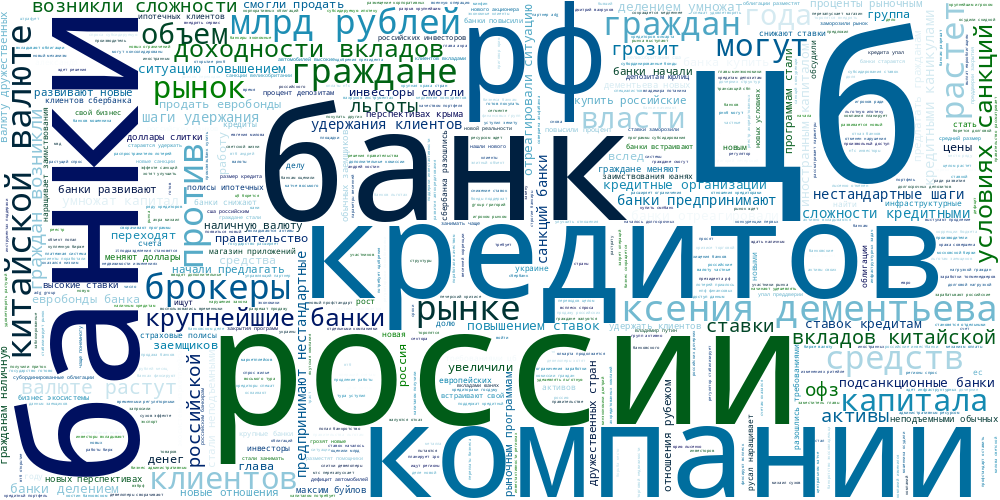

In [ ]:
text = suptitle_data[suptitle_data['datetime'] == 2022]['suptitle']
draw_cloud(text)

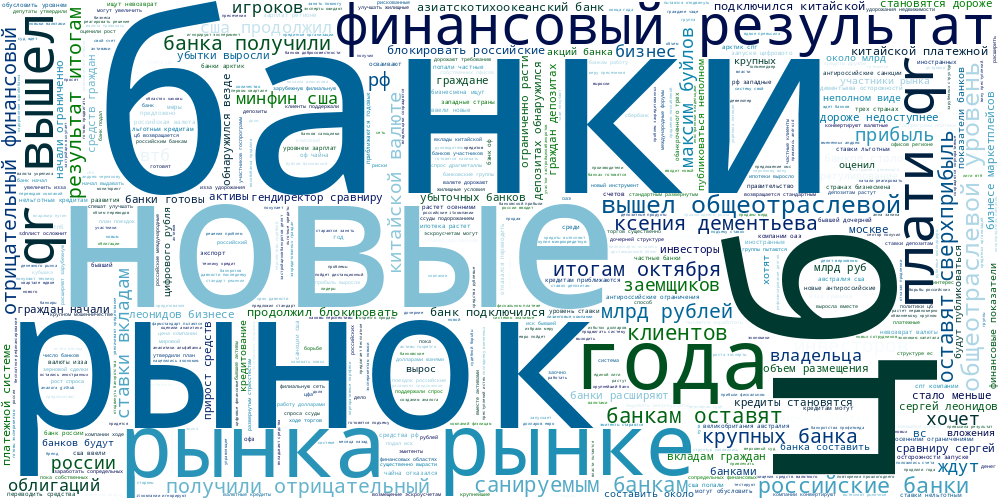

In [ ]:
text = suptitle_data[suptitle_data['datetime'] == 2023]['suptitle']
draw_cloud(text)

In [18]:
data[['bank', 'year', 'paper_text', 'paper_stemming_text', 'paper_lemmatizing_text']].to_excel('preprocessed_news.xlsx')

### Получение embeddings, необучаемые методы

In [19]:
data = pd.read_excel('preprocessed_news.xlsx').drop(columns = ['Unnamed: 0'], axis=1)

In [20]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [21]:
tfidf_stem = TfidfVectorizer(min_df=3)
tfidf_stem.fit(data['paper_stemming_text'])

tfidf_lem = TfidfVectorizer(min_df=3)
tfidf_lem.fit(data['paper_lemmatizing_text'])

TfidfVectorizer(min_df=3)

In [27]:
def get_vectors(text_cols, vectorizer, averaging, data=data, name_cols='bank'):

    cols = ['bank']+[x for x in range(len(vectorizer.vocabulary_))]
    bank_vectors = pd.DataFrame(columns=cols)

    if averaging == 'micro':
      for bank in np.unique(data[name_cols]):
          sen = np.mean(vectorizer.transform(data[data[name_cols] == bank][text_cols]), axis=0)
          vec = pd.DataFrame(sen)
          vec.insert(0, "bank", [bank])
          bank_vectors = pd.concat([bank_vectors, vec], axis=0)
      return bank_vectors

    if averaging == 'macro':
      bank_vectors = pd.DataFrame(vectorizer.transform(data[text_cols]).toarray())
      bank_vectors.insert(0, "bank", data[name_cols].reset_index(drop=True))
      return bank_vectors

In [28]:
micro_stem_tfidf = get_vectors('paper_stemming_text', tfidf_stem, 'micro')
macro_stem_tfidf = get_vectors('paper_stemming_text', tfidf_stem, 'macro')
micro_lem_tfidf = get_vectors('paper_lemmatizing_text', tfidf_lem, 'micro')
macro_lem_tfidf = get_vectors('paper_lemmatizing_text', tfidf_lem, 'macro')

/var/folders/0v/mjh6qpnj1jvg0mmzcsb5mz5r0000gn/T/ipykernel_79320/411817620.py:11: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  bank_vectors = pd.concat([bank_vectors, vec], axis=0)
/var/folders/0v/mjh6qpnj1jvg0mmzcsb5mz5r0000gn/T/ipykernel_79320/411817620.py:11: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  bank_vectors = pd.concat([bank_vectors, vec], axis=0)


### Метрики

In [29]:
!pip install bcubed

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.3.2 -> 24.0
[notice] To update, run: /Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip


In [30]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score
import bcubed

In [31]:
index_data = pd.read_excel('bank_index.xlsx')

In [32]:
import difflib

def find_similar_keys(list1, list2):
    similar_keys = {}
    for key2 in list2:
        closest_match = difflib.get_close_matches(key2, list1, n=1)
        if closest_match:
            similar_keys[key2] = closest_match[0]
    return similar_keys

similar_keys = find_similar_keys(list(index_data['banks']), list(pd.unique(data['bank'])))
translate_dict = dict(list(similar_keys.items())[:76])
translate_dict = {v:k for (k,v) in translate_dict.items()}
print(translate_dict)

{'Сбербанк': 'Сбербанк', 'ВТБ': 'ВТБ', 'Альфа-Банк': 'Альфа-Банк', 'Газпромбанк': 'Газпромбанк', 'Тинькофф Банк': 'Тинькофф Банк', 'Открытие': 'Банк Открытие', 'Совкомбанк': 'Совкомбанк', 'Росбанк': 'Росбанк', 'Промсвязьбанк': 'Промсвязьбанк', 'Россельхозбанк': 'Россельхозбанк', 'Почта Банк': 'Почта Банк', 'ДОМ.РФ': 'Банк ДОМ.РФ', 'МТС Банк': 'МТС Банк', 'Уралсиб': 'Банк Уралсиб', 'Райффайзен Банк': 'Райффайзен Банк', 'МКБ': 'МКБ', 'Кубань Кредит': 'Кубань Кредит', 'Банк Аверс': 'Банк Барс', 'Банк Санкт-Петербург': 'Банк Санкт-Петербург', 'ОТП Банк': 'ОТП Банк', 'Банк ПСКБ': 'Банк Союз', 'Абсолют Банк': 'Абсолют Банк', 'Ренессанс Банк': 'Ренессанс Кредит', 'Русский Стандарт': 'Русский Стандарт', 'УБРиР': 'Банк УБРиР', 'Кредит Европа Банк': 'Кредит Европа Банк', 'ЮниКредит Банк': 'ЮниКредит Банк', 'НС Банк': 'РН Банк', 'Азиатско-Тихоокеанский Банк': 'Азиатско-Тихоокеанский Банк', 'Экспобанк': 'Экспобанк', 'Банк Центр-инвест': 'Банк Центр-инвест', 'Банк ПТБ': 'Банк ВБРР', 'Локо-Банк': 'Л

In [33]:
index_data['banks'] = index_data['banks'].map(translate_dict)
index_data = index_data[['banks', 'index']].dropna()

In [34]:
def split_scores(num_groups, df=index_data):
    df_sorted = df.sort_values(by='index')
    quantiles = pd.qcut(df_sorted['index'], q=num_groups, labels=False)
    df_sorted['group'] = quantiles
    df_sorted = df_sorted.reset_index(drop=True)
    data = df_sorted[['banks', 'group']].set_index('banks')
    data['group'] = data['group'].apply(lambda x: set([str(x)]))
    clusters = data.T.to_dict('records')[0]
    return clusters

In [35]:
def form_equal_dict(dict1, dict2):
    if len(dict1.keys()) >= len(dict2.keys()):
      bigger = dict1
      smaller = dict2
    else:
      smaller = dict1
      bigger = dict2

    bigger = {k: v for (k,v) in bigger.items() if k in smaller.keys()}
    return bigger, smaller

In [36]:
def calc_metrics(embeds, labels, y_true, y_pred):
    y_true, y_pred = form_equal_dict(y_true, y_pred)
    precision_bcubed = bcubed.precision(y_pred, y_true)
    recall_bcubed = bcubed.recall(y_pred, y_true)
    fscore_bcubed = bcubed.fscore(precision_bcubed, recall_bcubed)
    return davies_bouldin_score(embeds, labels), calinski_harabasz_score(embeds, labels), silhouette_score(embeds, labels), fscore_bcubed

### Кластеризация

In [37]:
def clustering_bank(embed_data, method, averaging):
    banks = list(pd.unique(embed_data['bank']))
    if averaging == 'micro':
        method.fit(embed_data.iloc[:,1:])
        return dict(zip(list(embed_data['bank']), [set(list(str(x))) for x in method.labels_])), method.labels_

    if averaging == 'macro':
      method.fit(embed_data.iloc[:,1:])
      paper_cluster = pd.DataFrame({'bank':list(embed_data['bank'])})
      paper_cluster['labels'] = method.labels_
      banks_cluster = {}
      for i in banks:
          banks_cluster[i] = set(list(str(paper_cluster[paper_cluster['bank'] == i]['labels'].mode().iloc[0])))
      return banks_cluster, method.labels_

In [38]:
n_cluster = [2,3,4,5]
notes = pd.DataFrame(columns=['embed', 'clusterng', 'transform', 'n_cluster', 'averaging', 'davies_bouldin', 'calinski_harabasz_score', 'silhouette_score', 'f1_bcubed'])

#### Kmeans

In [39]:
from sklearn.cluster import KMeans
sns.set(rc={'figure.figsize':(10, 10)})

def plot_inertia(embeds):
    rg = range(1, 20)
    inertia = []
    for k in tqdm(rg):
        kmeans = KMeans(n_clusters=k, random_state=4, n_init='auto').fit(embeds.iloc[:,1:])
        inertia.append(np.sqrt(kmeans.inertia_))

    plt.plot(rg, inertia, marker='s')
    plt.xlabel('$k$')
    plt.ylabel('$J(C_k)$')
    plt.show()

def calc_methods_kmeans(embeds, emb_alg, transform, averaging, notes=notes, n_cluster=n_cluster):
    for n in tqdm(n_cluster):
        kmeans = KMeans(n_clusters=n, n_init='auto', random_state=42)
        bank_cluster, embed_labels = clustering_bank(embeds, kmeans, averaging)
        db, ch, ss, bc = calc_metrics(embeds.iloc[:,1:], embed_labels, split_scores(n), bank_cluster)
        notes.loc[len(notes)+1] = [emb_alg, 'k-means', transform, n, averaging, db, ch, ss, bc]

100%|██████████| 19/19 [00:22<00:00,  1.17s/it]


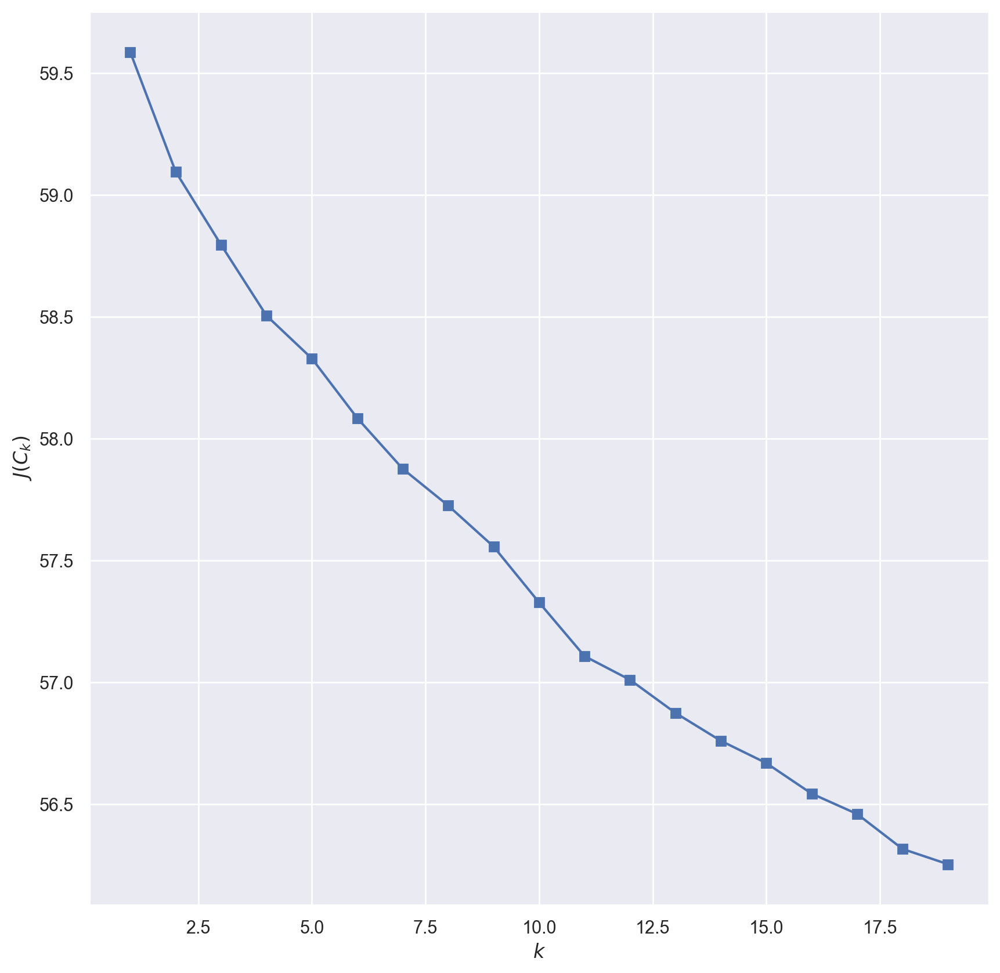

In [40]:
calc_methods_kmeans(macro_stem_tfidf, 'tf-idf', 'stem', 'macro')
plot_inertia(macro_stem_tfidf)

100%|██████████| 19/19 [00:02<00:00,  8.29it/s]


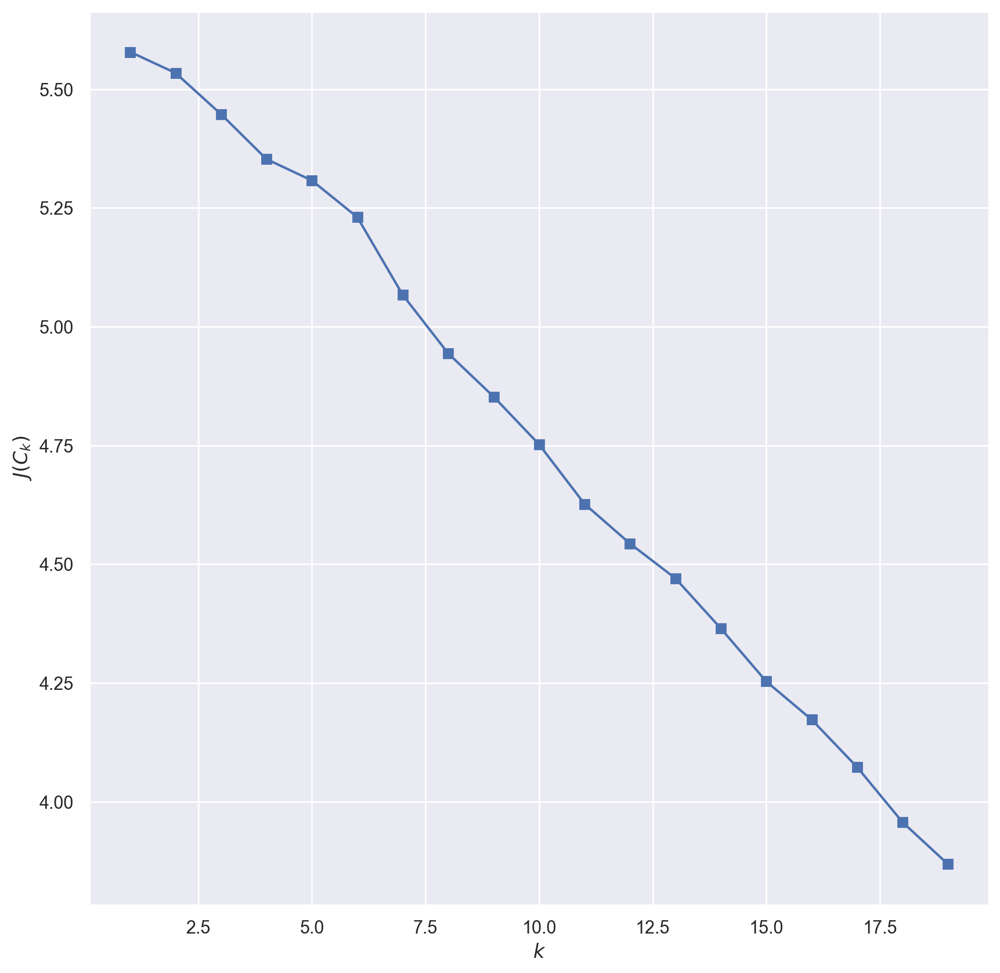

In [41]:
calc_methods_kmeans(micro_stem_tfidf, 'tf_idf', 'stem', 'micro')
plot_inertia(micro_stem_tfidf)

100%|██████████| 19/19 [00:22<00:00,  1.19s/it]


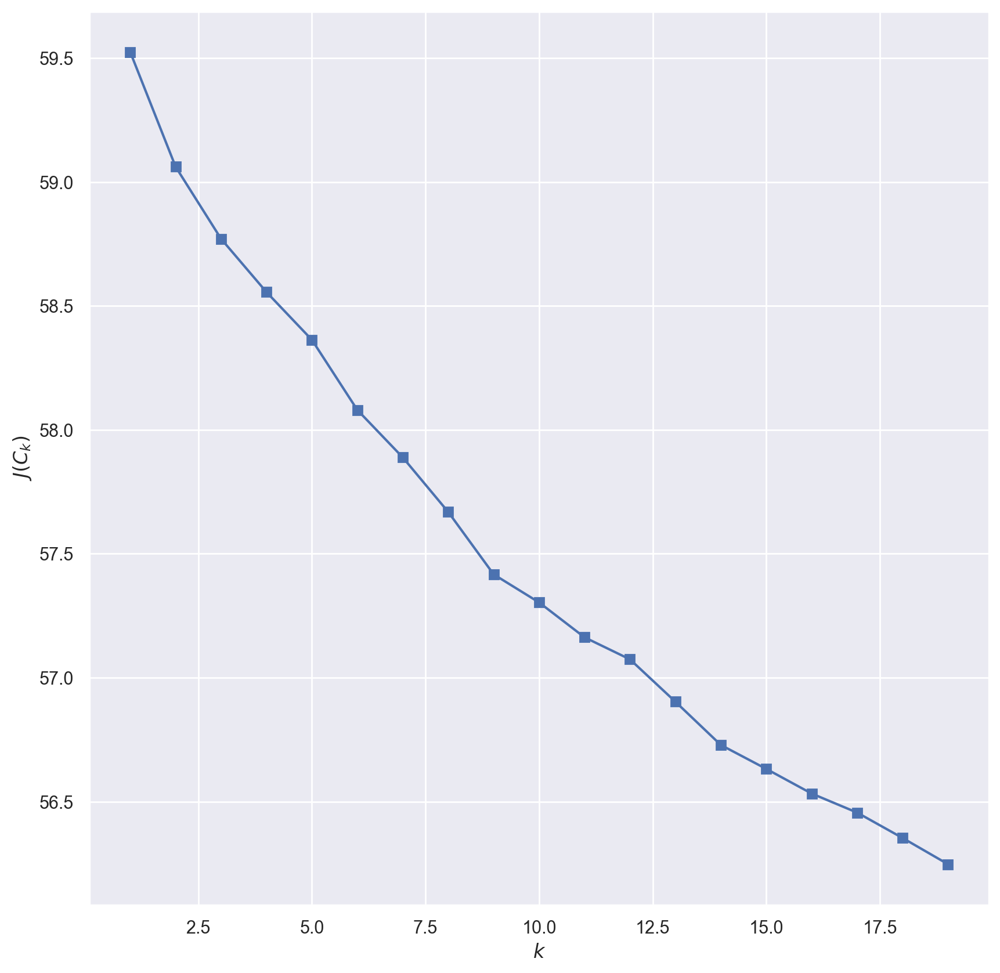

In [42]:
calc_methods_kmeans(macro_lem_tfidf, 'tf_idf', 'lem', 'macro')
plot_inertia(macro_lem_tfidf)

100%|██████████| 19/19 [00:03<00:00,  6.11it/s]


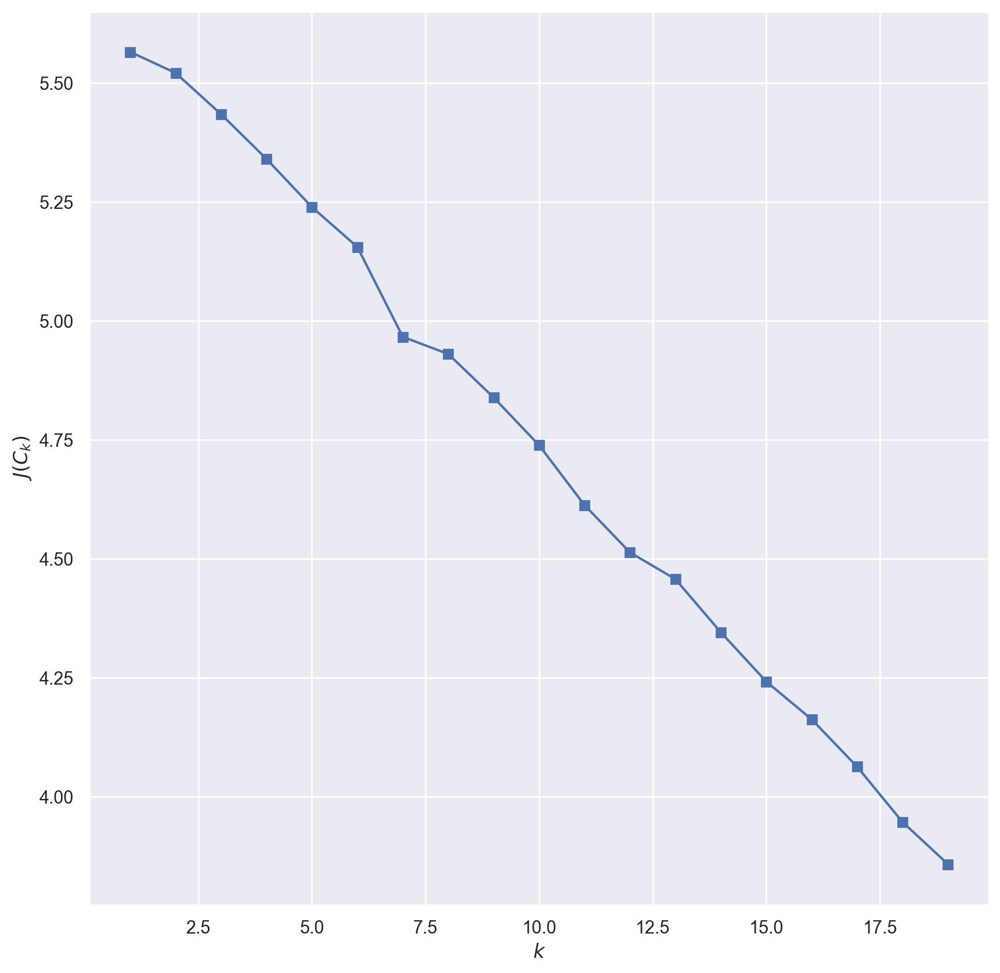

In [43]:
calc_methods_kmeans(micro_lem_tfidf, 'tf_idf', 'lem', 'micro')
plot_inertia(micro_lem_tfidf)

#### DBSCAN

In [44]:
from sklearn.cluster import DBSCAN
eps_list = [1.0 + 0.05 * x for x in range(17)]

def draw_anomaly_plot(embeds, eps = 0.1, eps_grow=0.01):
    # для начала считаем все наблюдения аномальными
    outlier_percentage = 1.

    num_clusters = []
    anomaly_percentage = []

    # берем маленький эпсилон и начинаем увеличивать
    eps_history = [eps]

    while outlier_percentage > 0.1:
        model = DBSCAN(eps=eps, min_samples=3).fit(embeds)

        labels = model.labels_
        num_clusters.append(len(np.unique(labels))-1)
        labels = np.array([1 if label == -1 else 0 for label in labels])

        # считаем текущий процент "шума"
        outlier_percentage = sum(labels==1) / len(labels)
        eps += eps_grow
        eps_history.append(eps)
        anomaly_percentage.append(outlier_percentage)


    iterations = eps_history[:-1]
    fig, ax1 = plt.subplots(figsize=(8,5))
    color = 'tab:red'
    ax1.set_xlabel('epsilon')
    ax1.set_ylabel('Number of clusters', color=color)
    ax1.plot(iterations, num_clusters, color=color)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()  # инициализация второй оси в соотвествии с размером первой

    color = 'tab:blue'
    ax2.set_ylabel('Anomaly %', color=color)
    ax2.plot(iterations, anomaly_percentage, color=color)
    ax2.tick_params(axis='y', labelcolor=color)

    fig.tight_layout()
    plt.show()

In [45]:
def calc_methods_dbscan(embeds, emb_alg, transform, averaging, notes=notes, eps_list=eps_list):
    for eps in tqdm(eps_list):
        dbscan = DBSCAN(eps=eps, min_samples=3)
        bank_cluster, embed_labels = clustering_bank(embeds, dbscan, averaging)
        try:
            n = np.unique(embed_labels).shape[0]
            db, ch, ss, bc = calc_metrics(embeds.iloc[:,1:], embed_labels, split_scores(n), bank_cluster)
            notes.loc[len(notes)+1] = [emb_alg, 'dbscan', transform, n, averaging, db, ch, ss, bc]
        except:
            continue

100%|██████████| 25/25 [01:55<00:00,  4.64s/it]


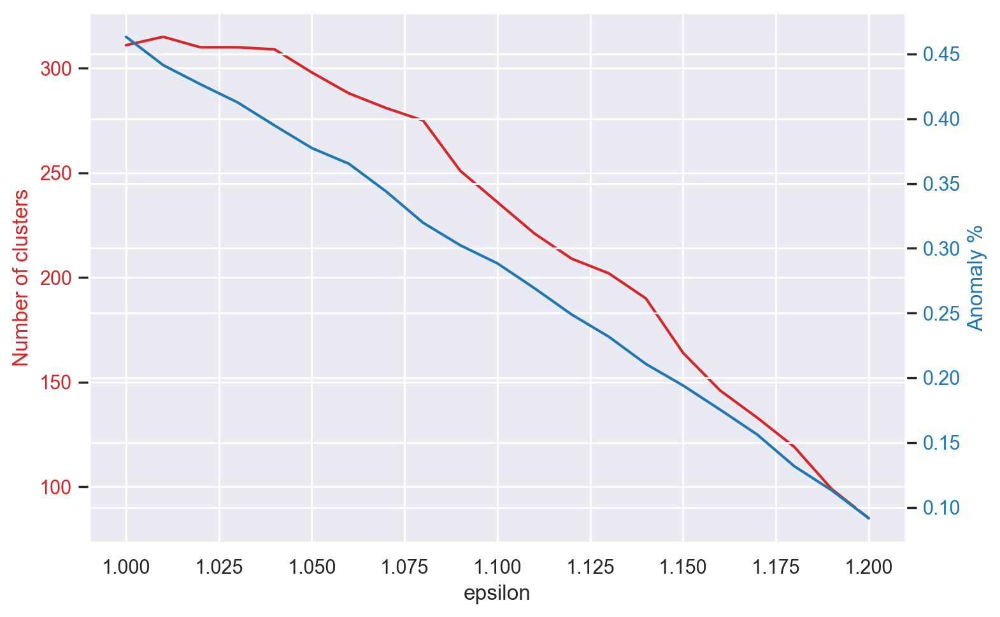

In [46]:
eps_list = [1.0 + 0.01 * x for x in range(25)]
calc_methods_dbscan(macro_stem_tfidf, 'tf_idf', 'stem', 'macro', eps_list=eps_list)
draw_anomaly_plot(macro_stem_tfidf.iloc[:,1:], eps=1, eps_grow=0.01)

100%|██████████| 25/25 [01:59<00:00,  4.77s/it]


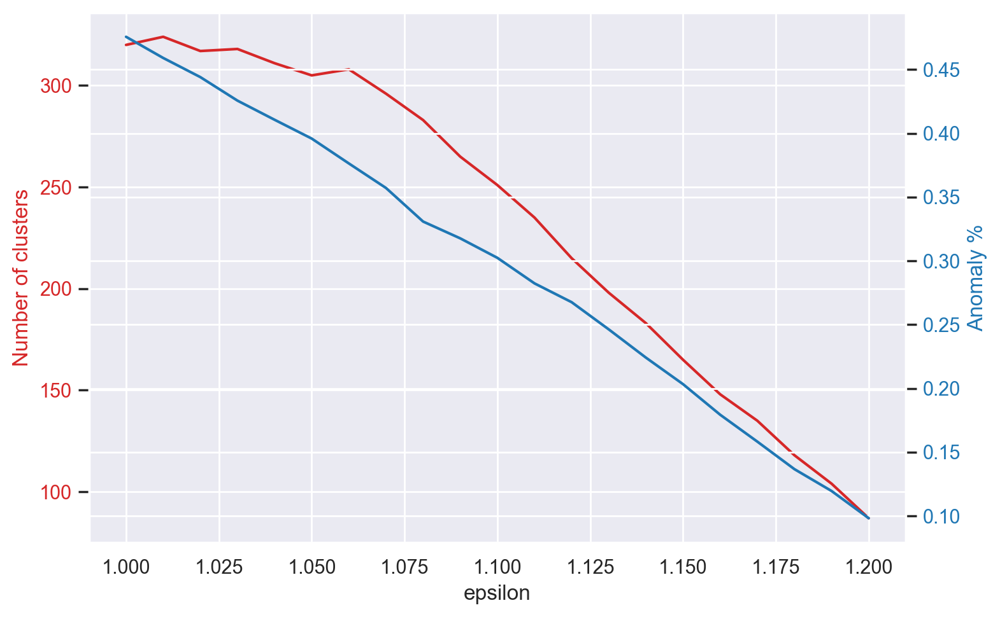

In [47]:
eps_list = [1.0 + 0.01 * x for x in range(25)]
calc_methods_dbscan(macro_lem_tfidf, 'tf_idf', 'lem', 'macro', eps_list=eps_list)
draw_anomaly_plot(macro_lem_tfidf.iloc[:,1:], eps=1, eps_grow=0.01)

100%|██████████| 25/25 [00:07<00:00,  3.33it/s]


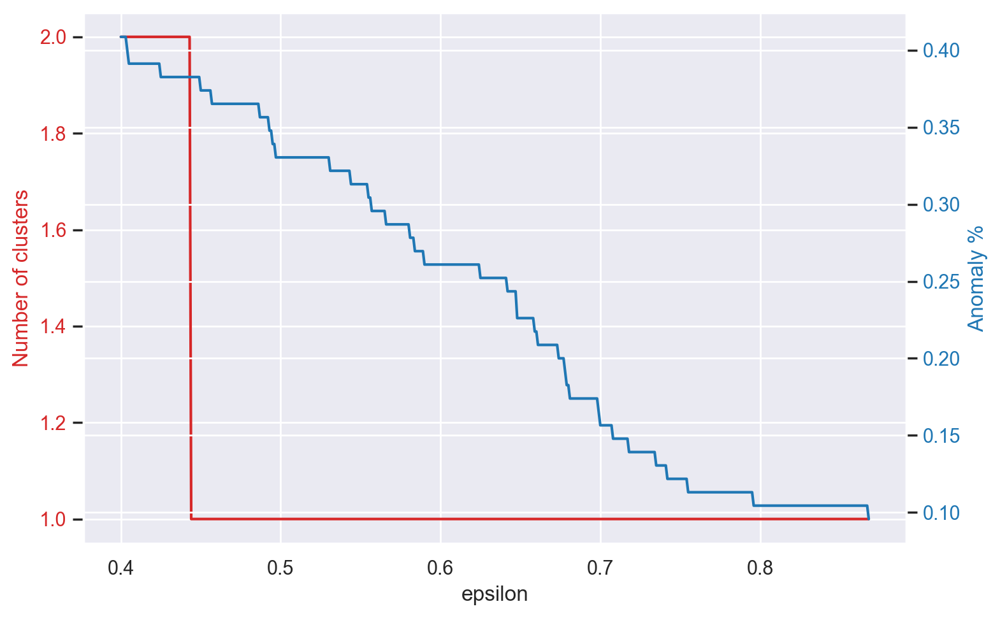

In [48]:
eps_list = [0.4 + 0.001 * x for x in range(25)]
calc_methods_dbscan(micro_lem_tfidf, 'tf_idf', 'lem', 'micro', eps_list=eps_list)
draw_anomaly_plot(micro_lem_tfidf.iloc[:,1:], eps=0.4, eps_grow=0.001)

100%|██████████| 25/25 [00:07<00:00,  3.23it/s]


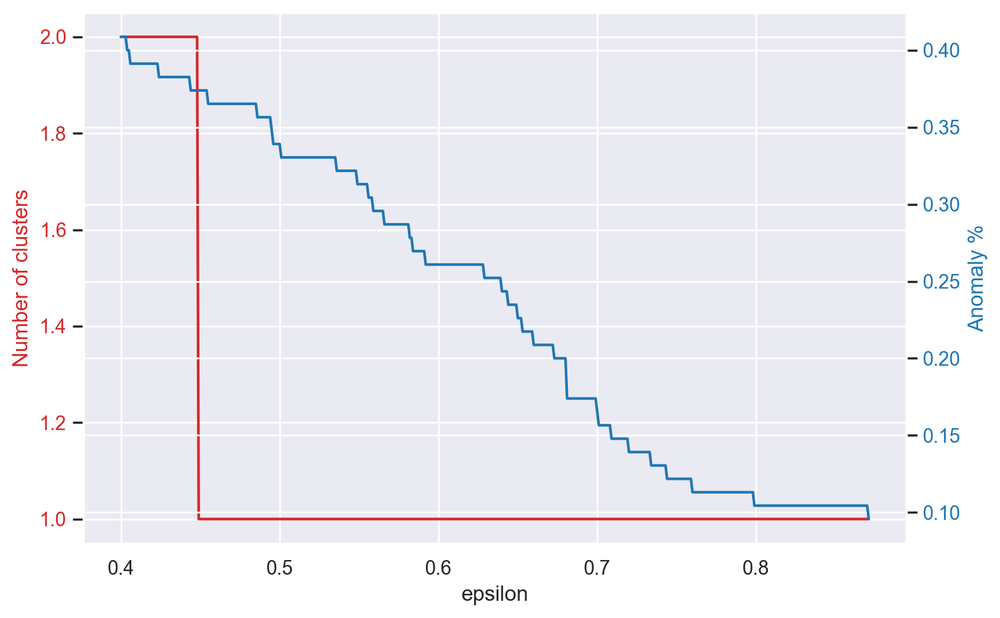

In [49]:
eps_list = [0.4 + 0.001 * x for x in range(25)]
calc_methods_dbscan(micro_stem_tfidf, 'tf_idf', 'stem', 'micro', eps_list=eps_list)
draw_anomaly_plot(micro_stem_tfidf.iloc[:,1:], eps=0.4, eps_grow=0.001)

#### Spectral

In [50]:
from sklearn.cluster import SpectralClustering
from scipy.sparse import csgraph

n_cluster = [2,3,4,5]

def draw_eigh(embeds):
    spectr = SpectralClustering(n_clusters=2, n_components=1, random_state=42)
    spectr.fit(embeds)
    L = csgraph.laplacian(spectr.affinity_matrix_)
    values, vectors = np.linalg.eigh(L)
    sns.lineplot(sorted(values[:10]))
    plt.plot()
    plt.ylabel('Eigenvalues')
    plt.xlabel('Numer of vectors')

def calc_methods_spectral(embeds, emb_alg, transform, averaging, notes=notes):
    for n in tqdm(n_cluster):
        spectr = SpectralClustering(n_clusters=n, n_components=1)
        bank_cluster, embed_labels = clustering_bank(embeds, spectr, averaging)
        db, ch, ss, bc = calc_metrics(embeds.iloc[:,1:], embed_labels, split_scores(n), bank_cluster)
        notes.loc[len(notes)+1] = [emb_alg, 'spectr', transform, n, averaging, db, ch, ss, bc]

100%|██████████| 4/4 [00:02<00:00,  1.56it/s]


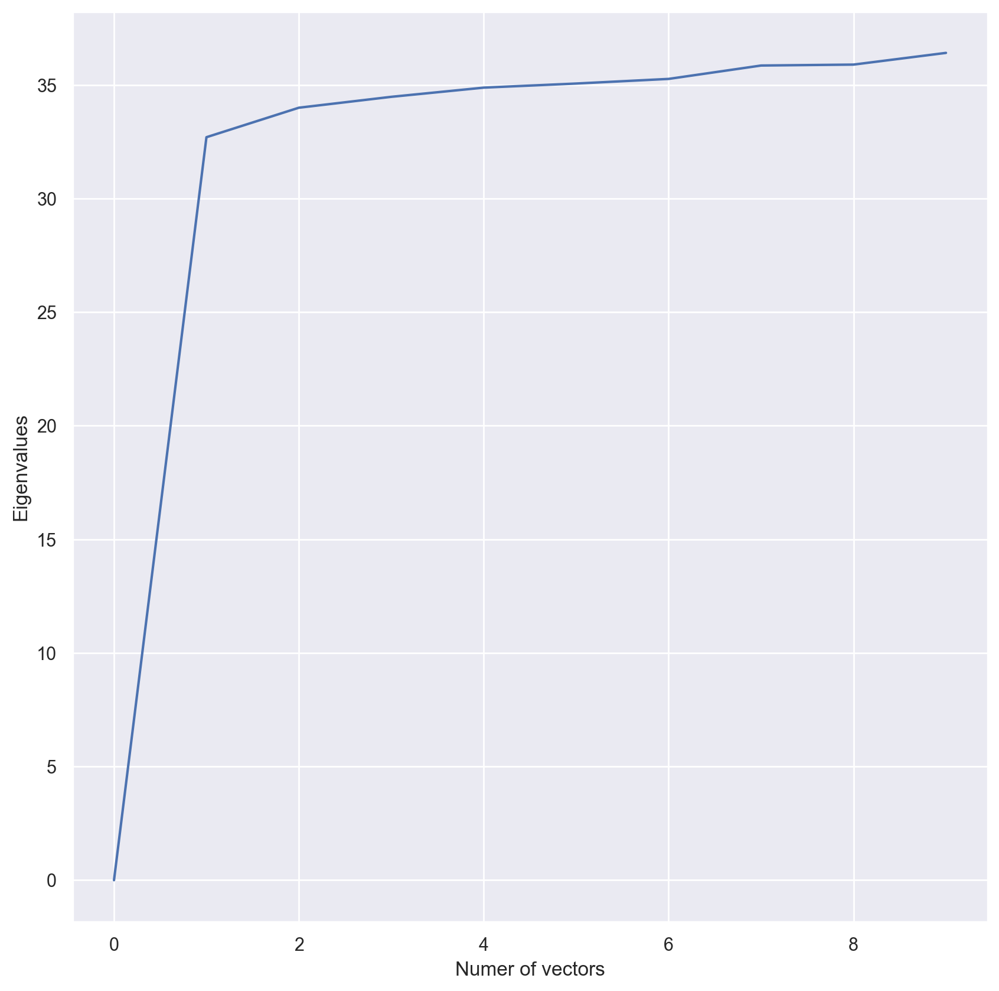

In [51]:
calc_methods_spectral(micro_stem_tfidf, 'tf-idf', 'stem', 'micro')
draw_eigh(micro_stem_tfidf.iloc[:,1:])

100%|██████████| 4/4 [00:02<00:00,  1.52it/s]


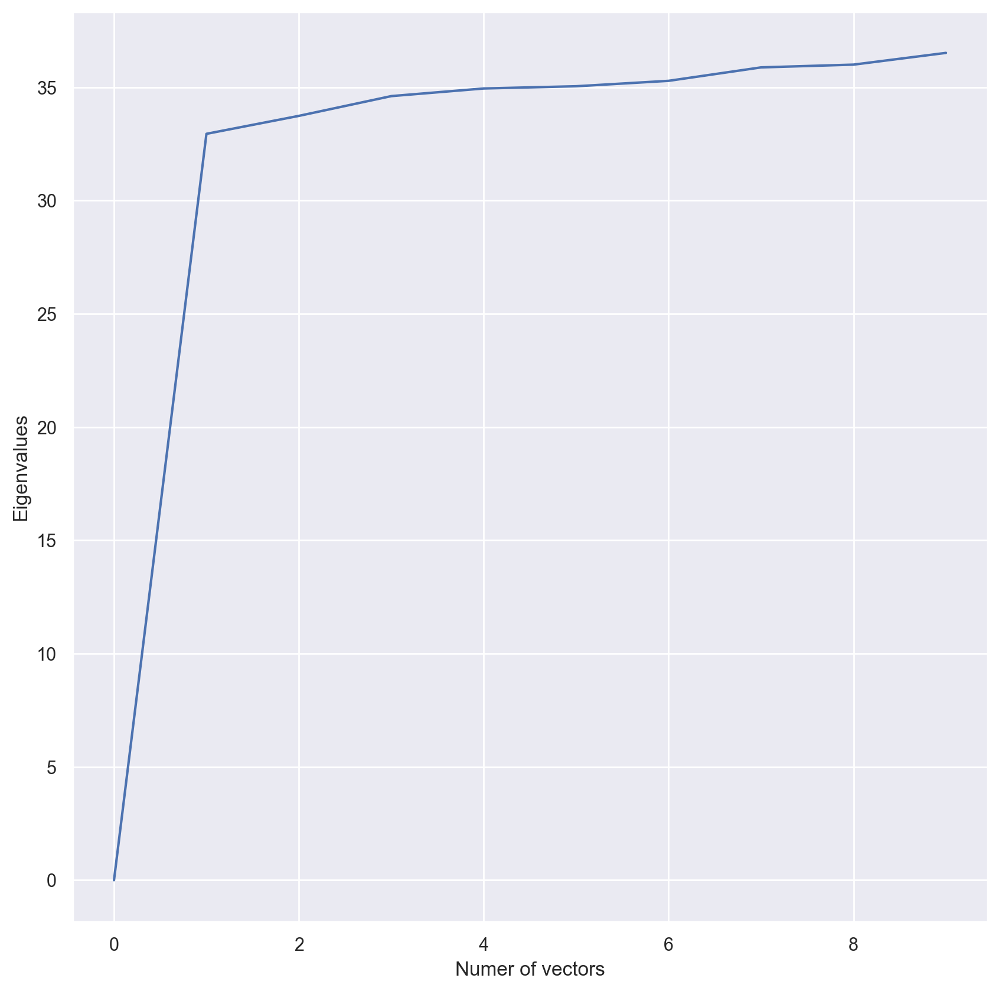

In [52]:
calc_methods_spectral(micro_lem_tfidf, 'tf-idf', 'lem', 'micro')
draw_eigh(micro_lem_tfidf.iloc[:,1:])

100%|██████████| 4/4 [00:19<00:00,  5.00s/it]


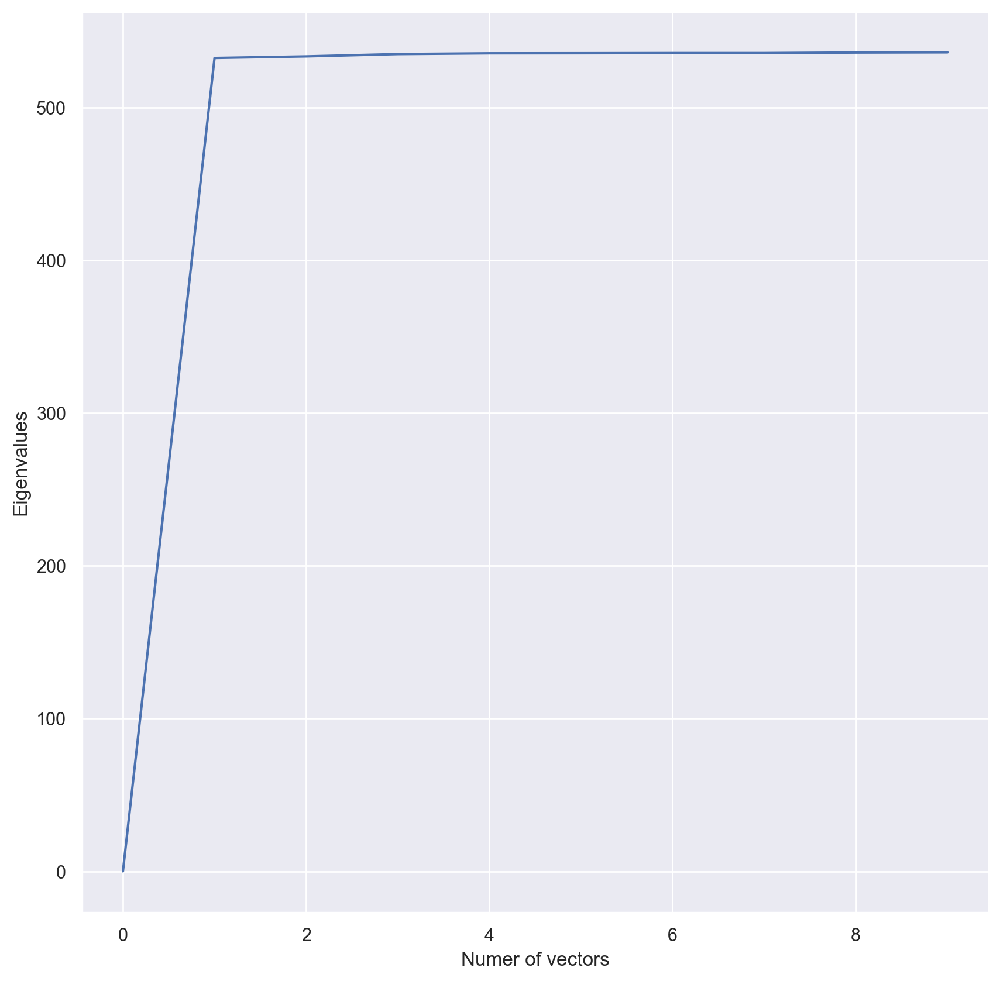

In [53]:
calc_methods_spectral(macro_stem_tfidf, 'tf-idf', 'stem', 'macro')
draw_eigh(macro_stem_tfidf.iloc[:,1:])

100%|██████████| 4/4 [00:18<00:00,  4.65s/it]


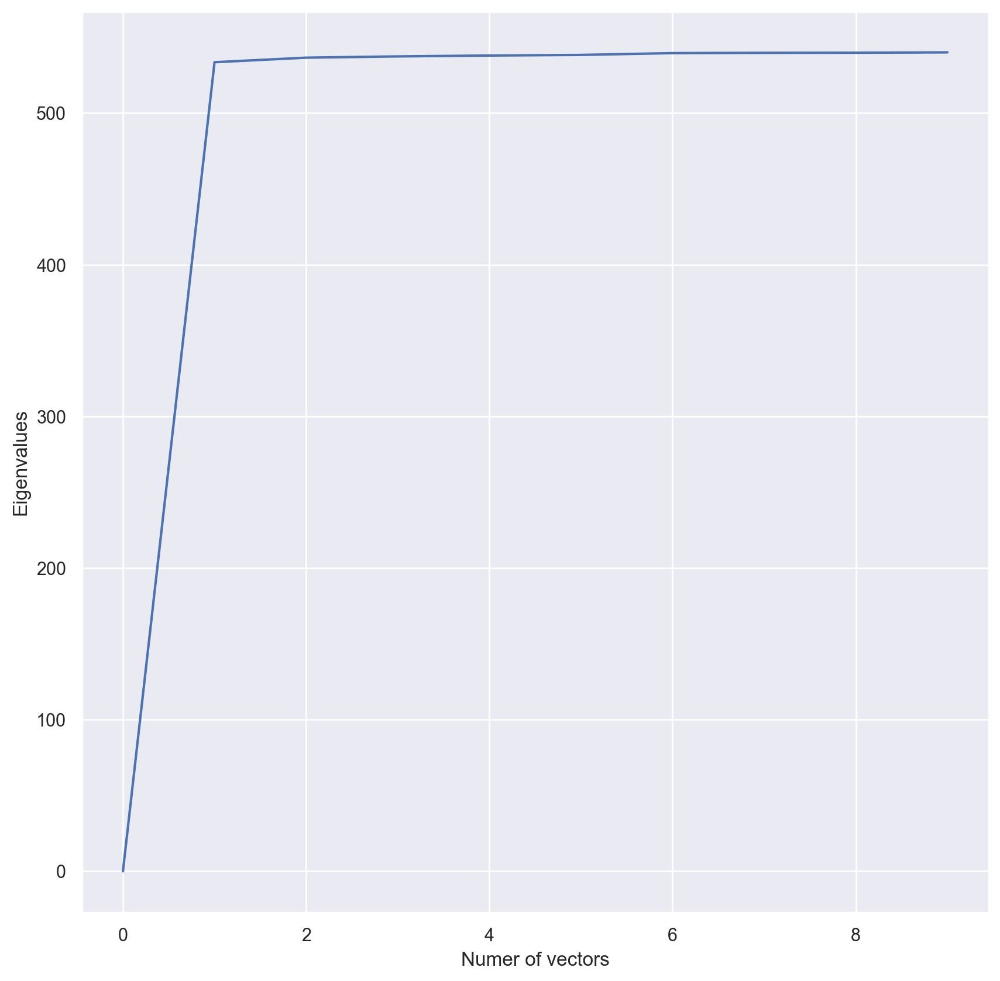

In [54]:
calc_methods_spectral(macro_lem_tfidf, 'tf-idf', 'lem', 'macro')
draw_eigh(macro_lem_tfidf.iloc[:,1:])

#### Fuzzy K-means

In [55]:
pip install scikit-fuzzy

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 994.0/994.0 kB 4.5 MB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 8.7 MB/s eta 0:00:00a 0:00:01m
  Created wheel for scikit-fuzzy: filename=scikit_fuzzy-0.4.2-py3-none-any.whl size=894089 sha256=92bc075d1b4d10710e6e6501b195ac8c3289bb30378364114e53b970da6ebfa6
  Stored in directory: /Users/ilgarmamedov/Library/Caches/pip/wheels/32/2c/a1/a90a7d7dd8448ec029f298a61f3490275e99b17aa348be675c
Successfully built scikit-fuzzy

[notice] A new release of pip is available: 23.3.2 -> 24.0
[notice] To update, run: /Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [56]:
import skfuzzy as fuzz
from skfuzzy import control as ctrl

In [57]:
def calc_methods_fuzzy(embeds, emb_alg, transform, averaging, notes=notes):
    data = embeds.iloc[:,1:].to_numpy()
    banks = list(pd.unique(embeds['bank']))

    for n in tqdm(n_cluster):
        if averaging == 'micro':
          cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(data.T, n, 2, error=0.005, maxiter=1000, init=None)
          labels = np.argmax(u, axis=0)
          banks_cluster = dict(zip(list(embeds['bank']), [set(list(str(x))) for x in labels]))

        if averaging == 'macro':
          cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(data.T, n, 2, error=0.005, maxiter=1000, init=None)
          labels = np.argmax(u, axis=0)

          paper_cluster = pd.DataFrame({'bank':list(embeds['bank'])})
          paper_cluster['labels'] = labels

          banks_cluster = {}
          for i in banks:
              banks_cluster[i] = set(list(str(paper_cluster[paper_cluster['bank'] == i]['labels'].mode().iloc[0])))

        db, ch, ss, bc = calc_metrics(embeds.iloc[:,1:], labels, split_scores(n), banks_cluster)
        notes.loc[len(notes)+1] = [emb_alg, 'fuzzy', transform, n, averaging, db, ch, ss, bc]

In [58]:
calc_methods_fuzzy(micro_lem_tfidf, 'tf-idf','lem', 'micro')

  0%|          | 0/4 [00:00<?, ?it/s]

100%|██████████| 4/4 [00:01<00:00,  2.95it/s]


In [59]:
calc_methods_fuzzy(macro_lem_tfidf, 'tf-idf','lem', 'macro')

100%|██████████| 4/4 [00:11<00:00,  2.86s/it]


In [60]:
calc_methods_fuzzy(micro_stem_tfidf, 'tf-idf','stem', 'micro')

100%|██████████| 4/4 [00:00<00:00,  4.51it/s]


In [61]:
calc_methods_fuzzy(macro_stem_tfidf, 'tf-idf','stem', 'macro')

100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


### Получение embeddings, обучаемые методы

In [ ]:
#препроцессинг для берта
extended_punctuation = punctuation+'«'+'»'+'“'+'”'
digits = '0123456789'

def bert_processing(text, russian_stopwords=russian_stopwords, punctuation=extended_punctuation, digits=digits):

    text = str(text).lower()
    for i in punctuation:
      text = text.replace(i, '')

    for i in digits:
      text = text.replace(i, '')

    return text

In [ ]:
comments_raw_data = pd.read_excel('Новости коммераснат.xlsx')
comments_raw_data['datetime'] = pd.to_datetime(comments_raw_data['datetime'], format='%d.%m.%Y, %H:%M')
comments_raw_data = comments_raw_data.drop(columns=['Unnamed: 0'])
comments_raw_data = comments_raw_data[comments_raw_data['bank'] != 'Банк Россия']

comments_raw_data['preprocess_text'] = comments_raw_data['paper_text'].apply(lambda x: bert_processing(x))

In [ ]:
bert_df = comments_raw_data[['bank', 'preprocess_text']]
bert_df.to_excel('bert_news.xlsx')

In [ ]:
bert_df = pd.read_excel('bert_news.xlsx').drop(columns=['Unnamed: 0']).dropna()

In [ ]:
bert_df

,bank,preprocess_text
0,Сбербанк,как выяснил ъ роснефть может осуществить крупн...
1,Сбербанк,декабря президент россии владимир путин прибы...
2,Сбербанк,стоимость российской нефти urals декабря обно...
4,Сбербанк,на фоне очередного снижения цен на золото и се...
5,Сбербанк,разработанные в евросоюзе новые правила обмена...
...,...,...
4045,Банк Восточный,словесные интервенции представителей финансовы...
4046,Банк Восточный,владельцы камчатского рыбного завода сокра чей...
4047,Банк Восточный,краснодарская компания восточный актив которую...
4048,Банк Восточный,цб установил для двух китайских банков индивид...


In [ ]:
import torch
from transformers import AutoTokenizer, AutoModel

In [ ]:
tokenizer = AutoTokenizer.from_pretrained("cointegrated/rubert-tiny")
model = AutoModel.from_pretrained("cointegrated/rubert-tiny")
model.cuda()

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/341 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/632 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/241k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/468k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/47.7M [00:00<?, ?B/s]

BertModel(
  (embeddings): BertEmbeddings(
    (word_embeddings): Embedding(29564, 312, padding_idx=0)
    (position_embeddings): Embedding(512, 312)
    (token_type_embeddings): Embedding(2, 312)
    (LayerNorm): LayerNorm((312,), eps=1e-12, elementwise_affine=True)
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (encoder): BertEncoder(
    (layer): ModuleList(
      (0-2): 3 x BertLayer(
        (attention): BertAttention(
          (self): BertSelfAttention(
            (query): Linear(in_features=312, out_features=312, bias=True)
            (key): Linear(in_features=312, out_features=312, bias=True)
            (value): Linear(in_features=312, out_features=312, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (output): BertSelfOutput(
            (dense): Linear(in_features=312, out_features=312, bias=True)
            (LayerNorm): LayerNorm((312,), eps=1e-12, elementwise_affine=True)
            (dropout): Dropout(p=0.1, inplace=False)
    

In [ ]:
def embed_bert_cls(text, model=model, tokenizer=tokenizer):
    t = tokenizer(text, padding=True, truncation=True, return_tensors='pt')
    with torch.no_grad():
        model_output = model(**{k: v.to(model.device) for k, v in t.items()})
    embeddings = model_output.last_hidden_state[:, 0, :]
    embeddings = torch.nn.functional.normalize(embeddings)
    return embeddings[0].cpu().numpy()

In [ ]:
# получаем эмбединги для каждого банка, как средние
bank_vectors = pd.DataFrame(columns=['bank']+[x for x in range(312)])
for bank in tqdm(np.unique(data['bank'])):
    bank_embeds = pd.DataFrame(columns=[x for x in range(312)])
    bank_text_data = data[data['bank'] == bank]['paper_text']
    for text in bank_text_data:
        bank_embeds = pd.concat([bank_embeds, pd.DataFrame(embed_bert_cls(text).reshape(1,-1))], axis=0)
    sen = np.mean(bank_embeds.to_numpy(), axis=0)
    vec = pd.DataFrame(sen.reshape(1,-1))
    vec.insert(0, "bank", [bank])
    bank_vectors = pd.concat([bank_vectors, vec], axis=0)

bert_micro = bank_vectors.copy()

100%|██████████| 115/115 [00:40<00:00,  2.83it/s]


In [ ]:
bert_micro.to_excel('bert_micro.xlsx', index=False)

In [ ]:
# получаем эмбединги для каждого текста
bank_vectors = pd.DataFrame(columns=[x for x in range(312)])
for text in tqdm(data['paper_text']):
    bank_vectors = pd.concat([bank_vectors, pd.DataFrame(embed_bert_cls(text).reshape(1,-1))], axis=0)
bank_vectors.insert(0, "bank", list(data["bank"]))
bert_macro = bank_vectors.copy()

100%|██████████| 3797/3797 [00:38<00:00, 98.11it/s] 


In [ ]:
bert_macro.to_excel('bert_macro.xlsx', index=False)

In [62]:
bert_macro = pd.read_excel('bert_macro.xlsx')
bert_micro = pd.read_excel('bert_micro.xlsx')

In [63]:
bert_macro

,bank,0,1,2,3,4,5,6,7,8,...,302,303,304,305,306,307,308,309,310,311
0,Сбербанк,0.065436,-0.015456,-0.044932,0.011753,0.028973,-0.013663,-0.013261,-0.009040,0.011312,...,0.054546,-0.025700,0.000999,0.074204,0.022819,0.017840,-0.007494,-0.050637,0.035338,-0.030595
1,Сбербанк,0.074643,0.017349,-0.040293,0.004610,-0.025029,-0.014985,-0.002632,-0.074342,-0.018499,...,-0.008976,-0.032565,0.007683,0.093568,-0.041439,0.015531,-0.008045,-0.037444,0.000195,-0.083685
2,Сбербанк,0.070635,0.014881,-0.002972,0.009670,0.019306,-0.016906,-0.020494,-0.041966,0.024052,...,0.033679,-0.065168,-0.018557,0.021149,0.028448,-0.008674,0.047459,-0.038903,0.009126,-0.020888
3,Сбербанк,0.057855,0.022603,-0.015218,0.012660,0.031357,-0.030739,-0.037479,-0.049714,0.009750,...,0.080979,-0.081945,-0.023403,0.018095,0.044836,-0.006435,0.039710,-0.060462,0.025029,0.009098
4,Сбербанк,0.066551,-0.032813,-0.018770,0.015082,0.003115,-0.017107,-0.026266,-0.059605,0.014895,...,0.039355,-0.040178,-0.025966,0.081334,0.006038,0.017424,0.045214,-0.022409,-0.021031,-0.039866
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3792,Банк Восточный,0.061540,0.016710,-0.010804,0.021751,0.002625,-0.016668,-0.030557,-0.069079,0.033008,...,0.055781,-0.087987,-0.033833,0.021626,0.034248,-0.017625,0.047687,-0.059625,0.049992,-0.000571
3793,Банк Восточный,0.027785,-0.026083,-0.044056,0.050368,-0.014705,-0.019801,-0.017400,-0.063337,0.029741,...,0.084703,-0.006573,-0.014407,0.120324,-0.008489,-0.009310,0.026746,-0.077816,0.016667,-0.043183
3794,Банк Восточный,0.049351,-0.012862,-0.025325,0.032898,-0.023394,0.008034,-0.007240,-0.028519,0.034387,...,0.073090,0.028284,-0.008308,0.131633,-0.017185,0.001249,0.030082,-0.058828,0.002531,-0.072279
3795,Банк Восточный,0.055569,-0.029431,-0.024062,0.022941,0.023580,-0.005282,-0.025536,-0.066184,0.034341,...,0.082083,-0.108301,-0.026603,0.053632,0.045452,-0.020811,0.078932,-0.066485,0.034083,-0.019310


In [64]:
bert_micro

,bank,0,1,2,3,4,5,6,7,8,...,302,303,304,305,306,307,308,309,310,311
0,Абсолют Банк,0.063679,-0.004352,-0.034324,0.017309,0.012567,-0.020964,-0.033856,-0.068001,0.028049,...,0.074634,-0.077778,-0.035084,0.063737,0.034154,-0.002752,0.057923,-0.054327,0.020436,-0.031946
1,Азиатско-Тихоокеанский Банк,0.063587,-0.008541,-0.034405,0.021108,0.009139,-0.014166,-0.021688,-0.066797,0.023416,...,0.065134,-0.070347,-0.034313,0.061973,0.018350,0.000769,0.055861,-0.046256,0.011458,-0.046463
2,Акибанк,0.058521,-0.037387,-0.047390,0.034394,0.014000,-0.009477,-0.019024,-0.063946,0.010939,...,0.054837,-0.080438,-0.063913,0.066391,-0.010521,0.007870,0.051990,-0.036443,-0.000466,-0.087516
3,Александровский,0.054437,-0.007220,-0.037922,0.017615,-0.014570,-0.018876,0.008874,-0.047374,0.000739,...,0.015999,-0.018618,-0.003993,0.077240,-0.042152,0.009401,0.000018,-0.048393,0.005690,-0.047149
4,Алмазэргиэнбанк,0.069106,-0.048773,-0.005455,0.035753,-0.043182,0.001639,0.007799,-0.050875,0.053068,...,0.048680,-0.015913,0.013387,0.061318,0.011023,0.007329,0.024035,-0.024075,0.024003,-0.025339
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110,ЦентроКредит,0.067592,-0.022347,-0.020412,0.012902,0.016460,0.020838,-0.045187,-0.042984,0.027424,...,0.069390,-0.072406,-0.075760,0.072577,0.002556,0.003926,0.047100,-0.027798,-0.003633,-0.100911
111,Челябинвестбанк,0.062214,-0.019664,-0.027073,0.029618,-0.005709,-0.014641,-0.013984,-0.084782,0.020970,...,0.045331,-0.053365,-0.016553,0.064149,-0.003378,-0.003398,0.052119,-0.050765,-0.018700,-0.025630
112,Экспобанк,0.060667,-0.006204,-0.030530,0.011990,0.009753,-0.014761,-0.036448,-0.054289,0.024902,...,0.058010,-0.057105,-0.029849,0.066667,0.027323,0.004365,0.054022,-0.050646,0.010895,-0.041081
113,ЮГ-Инвестбанк,0.074481,-0.000015,-0.047234,0.017183,0.017488,-0.029586,-0.029533,-0.036867,0.027126,...,0.036693,-0.034043,-0.022665,0.103558,-0.003144,-0.001015,0.038961,-0.028889,-0.015559,-0.052286


#### K-means

100%|██████████| 19/19 [00:00<00:00, 119.20it/s]


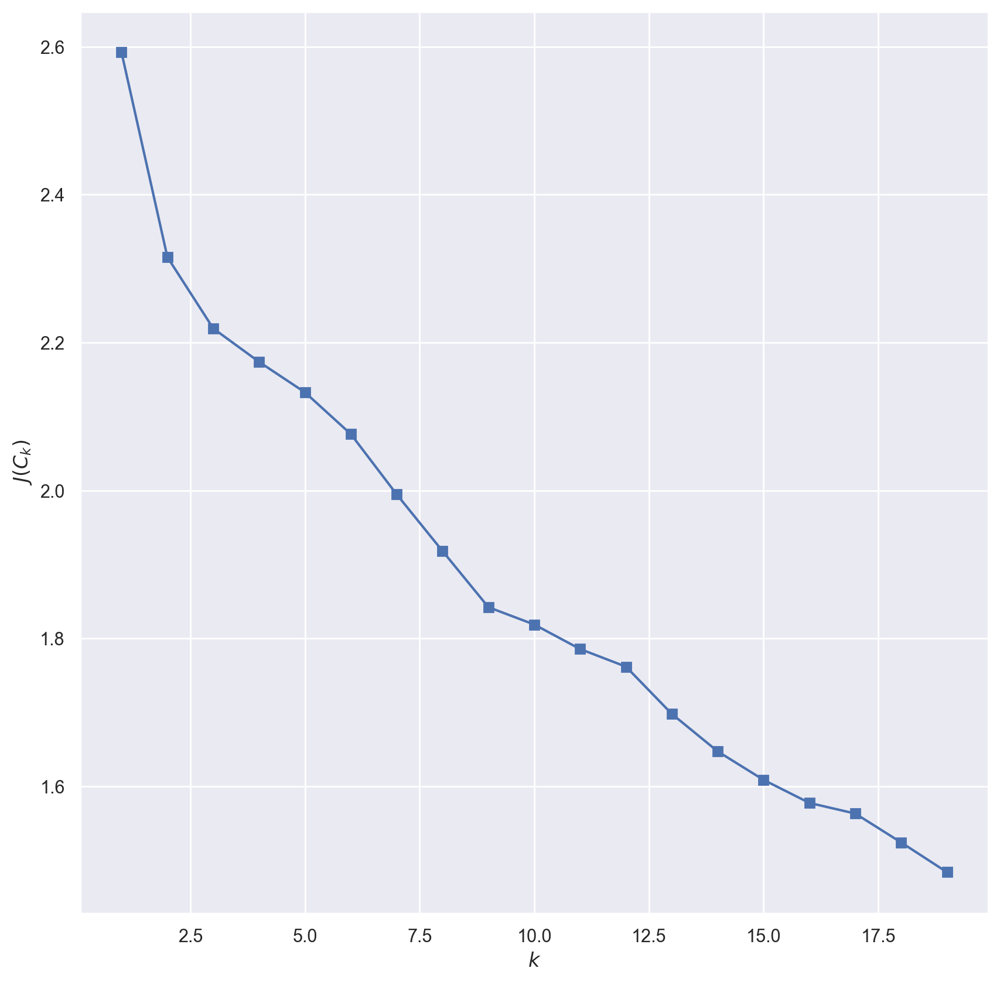

In [65]:
calc_methods_kmeans(bert_micro, 'bert', None, 'micro')
plot_inertia(bert_micro)

100%|██████████| 19/19 [00:02<00:00,  7.78it/s]


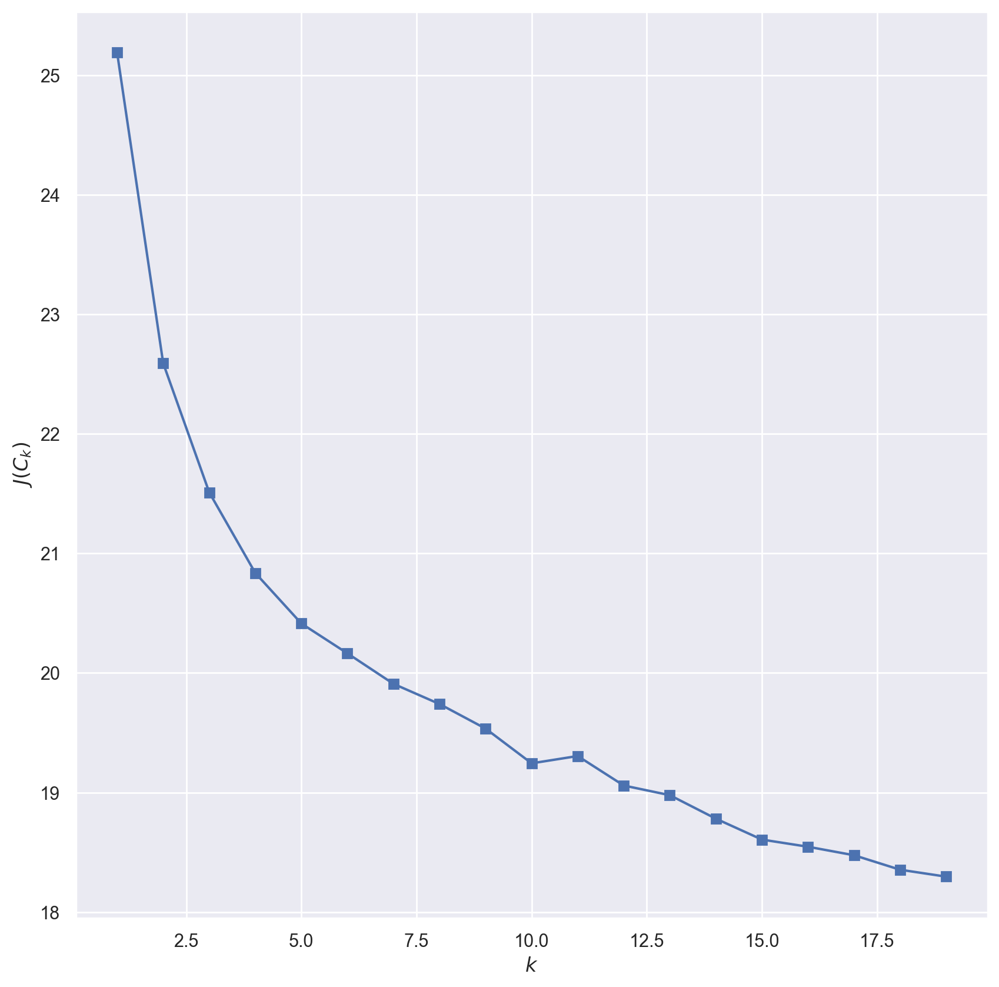

In [66]:
calc_methods_kmeans(bert_macro, 'bert', None, 'macro')
plot_inertia(bert_macro)

#### DBSCAN

100%|██████████| 17/17 [00:05<00:00,  2.88it/s]


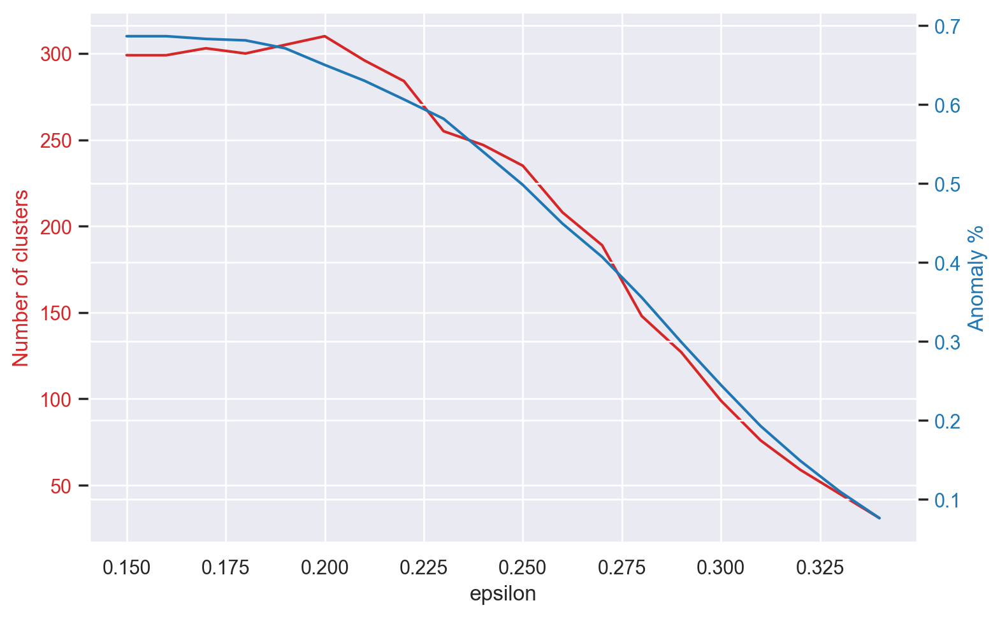

In [67]:
eps_list = [0.01 + 0.05 * x for x in range(17)]
calc_methods_dbscan(bert_macro, 'bert', None, 'macro', eps_list=eps_list)
draw_anomaly_plot(bert_macro.iloc[:,1:], eps=0.15, eps_grow=0.01)

100%|██████████| 20/20 [00:00<00:00, 45.05it/s]


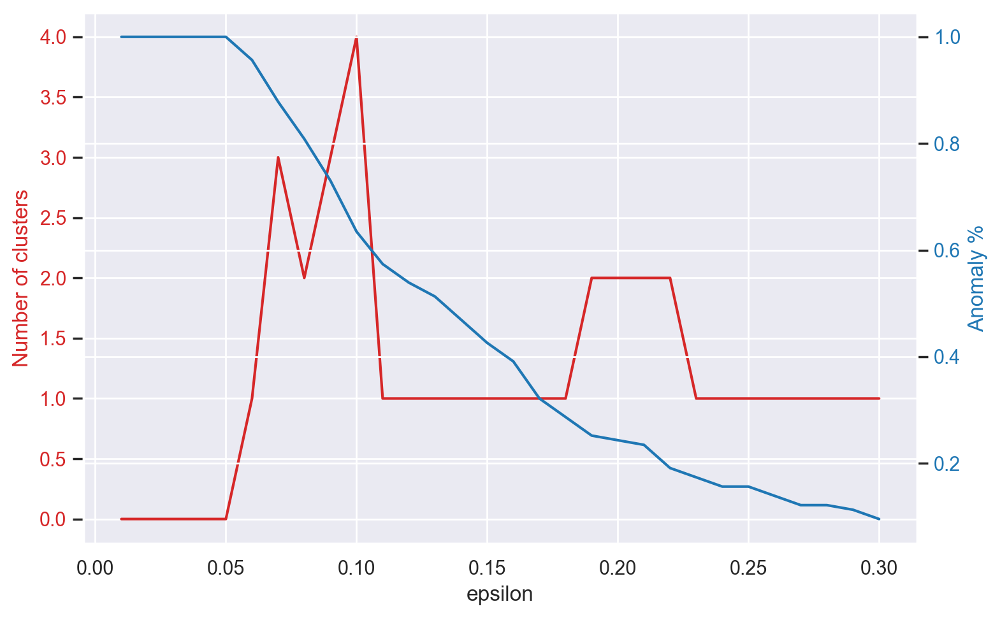

In [68]:
eps_list = [0.01 + 0.01 * x for x in range(20)]
calc_methods_dbscan(bert_micro, 'bert', None, 'micro', eps_list=eps_list)
draw_anomaly_plot(bert_micro.iloc[:,1:], eps=0.01, eps_grow=0.01)

#### Spectral

100%|██████████| 4/4 [00:04<00:00,  1.20s/it]


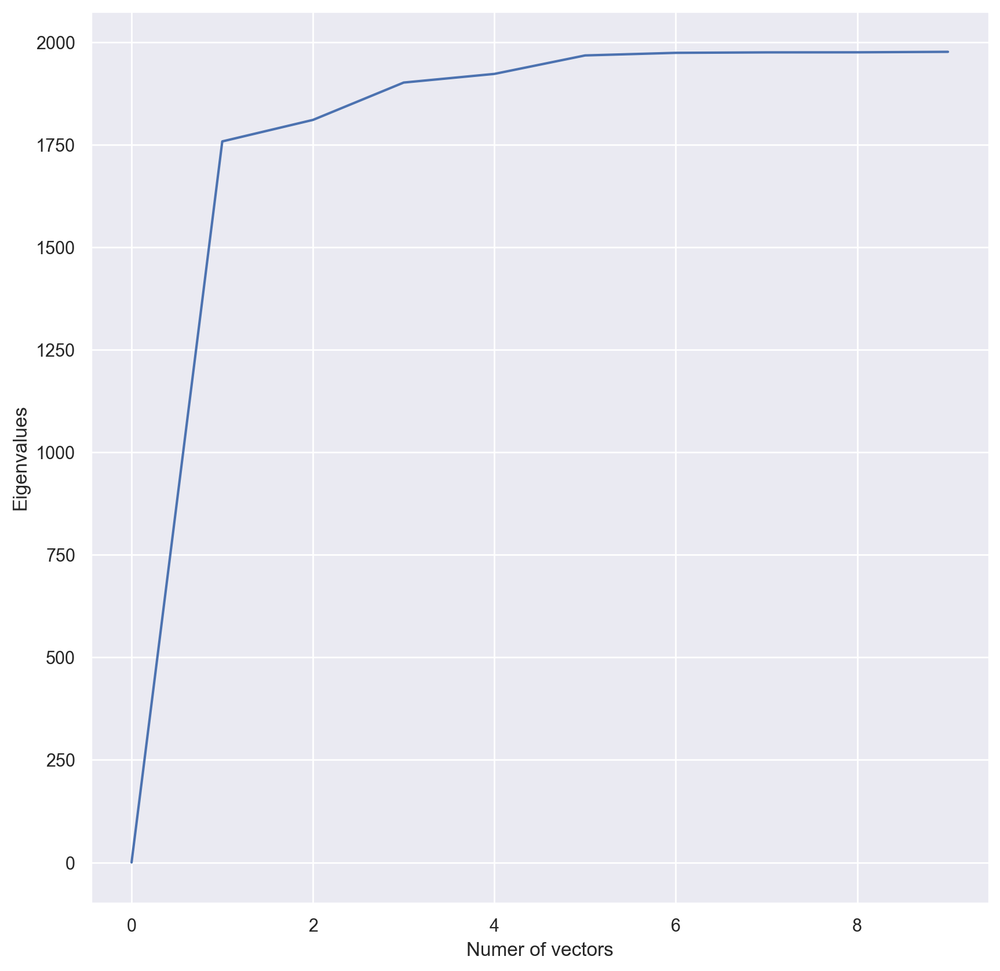

In [69]:
calc_methods_spectral(bert_macro, 'bert', None, 'macro')
draw_eigh(bert_macro.iloc[:,1:])

100%|██████████| 4/4 [00:01<00:00,  2.50it/s]


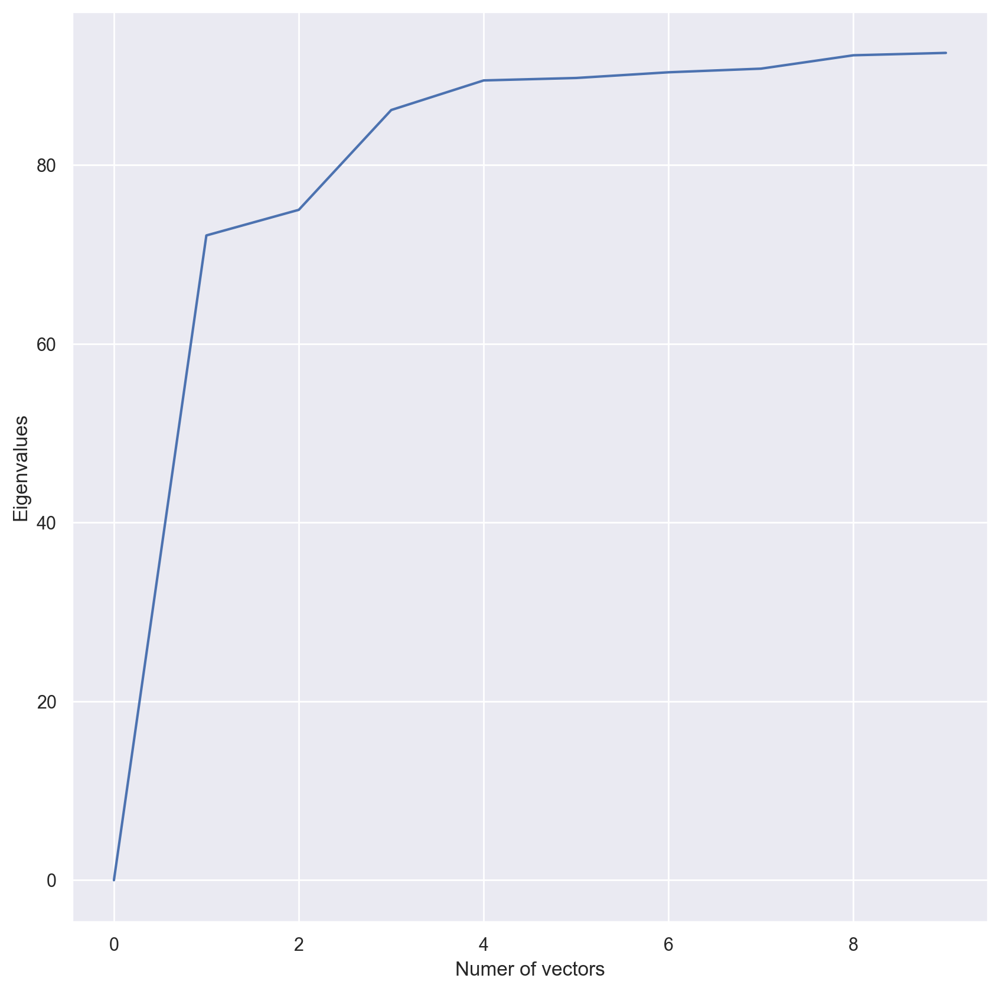

In [70]:
calc_methods_spectral(bert_micro, 'bert', None, 'micro')
draw_eigh(bert_micro.iloc[:,1:])

#### Fuzzy K-means

In [71]:
calc_methods_fuzzy(bert_micro, 'bert', None, 'micro')

100%|██████████| 4/4 [00:00<00:00, 30.17it/s]


In [72]:
calc_methods_fuzzy(bert_macro, 'bert', None, 'macro')

100%|██████████| 4/4 [00:00<00:00,  4.33it/s]


### Тематическое моделирование

In [73]:
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer

In [74]:
bag_stem = CountVectorizer(min_df=3)
bag_stem.fit(data['paper_stemming_text'])

bag_lem = CountVectorizer(min_df=3)
bag_lem.fit(data['paper_lemmatizing_text'])

CountVectorizer(min_df=3)

In [75]:
macro_stem_bag = get_vectors('paper_stemming_text', bag_stem, 'macro')
macro_lem_bag = get_vectors('paper_lemmatizing_text', bag_lem, 'macro')

In [76]:
banks = list(pd.unique(data['bank']))

for experiment in [0,1]:
    if experiment == 0:
      processing = 'lem'
      embeds = macro_lem_bag

    if experiment == 1:
      processing = 'stem'
      embeds = macro_stem_bag

    for n in tqdm([2,3,4,5,6,7,8,9,10]):
        lda_ = LatentDirichletAllocation(n_components=n, random_state=0)
        topics = lda_.fit_transform(embeds.iloc[:,1:])
        labels = np.argmax(topics, axis=1)
        data[f'lda_label'] = labels

        bank_cluster = {}
        cols = ['bank']+[x for x in range(n)]
        bank_embedind = pd.DataFrame(columns=cols)
        labels_list = []
        for i in banks:
            label = data[data['bank'] == i]['lda_label'].mode().iloc[0]
            labels_list.append(label)
            bank_cluster[i] = set(list(str(label)))
            bank_idx = embeds[embeds['bank'] == 'Сбербанк'].index
            vec = pd.DataFrame(topics[bank_idx, :].mean(axis=0)).T
            vec.insert(0, "bank", [i])
            bank_embedind = pd.concat([bank_embedind, vec], axis=0)

        db, ch, ss, bc = calc_metrics(bank_embedind.iloc[:,1:], np.array(labels_list), split_scores(n), bank_cluster)
        notes.loc[len(notes)+1] = ['bag', 'lda', None, n, 'micro', db, ch, ss, bc]

  0%|          | 0/9 [00:00<?, ?it/s]/var/folders/0v/mjh6qpnj1jvg0mmzcsb5mz5r0000gn/T/ipykernel_79320/376066473.py:29: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  bank_embedind = pd.concat([bank_embedind, vec], axis=0)
 11%|█         | 1/9 [00:15<02:00, 15.10s/it]/var/folders/0v/mjh6qpnj1jvg0mmzcsb5mz5r0000gn/T/ipykernel_79320/376066473.py:29: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  bank_embedind = pd.concat([bank_embedind, vec], axis=0)
 22%|██▏       | 2/9 [00:34<02:03, 17.66s/it]/var/

### Сравнение метрик

In [77]:
notes.sort_values('f1_bcubed').to_excel('news_result.xlsx')

In [78]:
notes

,embed,clusterng,transform,n_cluster,averaging,davies_bouldin,calinski_harabasz_score,silhouette_score,f1_bcubed
1,tf-idf,k-means,stem,2,macro,5.845107,63.796938,0.007470,0.648018
2,tf-idf,k-means,stem,3,macro,6.520532,47.019543,0.009594,0.476997
3,tf-idf,k-means,stem,4,macro,6.672087,47.028859,0.011300,0.349088
4,tf-idf,k-means,stem,5,macro,6.481047,40.108761,0.012272,0.345629
5,tf_idf,k-means,stem,2,micro,0.620709,1.905327,0.236526,0.666672
...,...,...,...,...,...,...,...,...,...
213,bag,lda,None,6,micro,0.000000,33.948527,0.000000,0.281086
214,bag,lda,None,7,micro,0.000000,15.029412,0.000000,0.251636
215,bag,lda,None,8,micro,0.000000,32.834165,0.000000,0.251520
216,bag,lda,None,9,micro,0.000000,17.371271,0.000000,0.257121


### Анализ лучших класстеризаций

#### tfidf

In [242]:
from sklearn.cluster import SpectralClustering

In [243]:
data_ = micro_stem_tfidf.iloc[:,1:].to_numpy()
banks = list(micro_stem_tfidf['bank'])

spectr = SpectralClustering(n_clusters=6)
spectr.fit(data_)

banks_cluster = dict(zip(banks, [set(list(str(x))) for x in spectr.labels_]))

embeds = micro_stem_tfidf.copy()
embeds.insert(1, 'label', list(spectr.labels_))

In [244]:
clusster_data = pd.DataFrame({'bank':banks})
clusster_data['clusters'] = spectr.labels_

In [245]:
from sklearn.manifold import TSNE

tsne = TSNE(learning_rate='auto', init='random')
d2_feat = tsne.fit_transform(micro_stem_tfidf.iloc[:,2:])

clusster_data['TSNE_0'] = d2_feat[:,0]
clusster_data['TSNE_1'] = d2_feat[:,1]

In [246]:
clusster_data

,bank,clusters,TSNE_0,TSNE_1
0,Абсолют Банк,2,0.072483,0.401450
1,Азиатско-Тихоокеанский Банк,2,0.517009,0.133189
2,Акибанк,3,-1.497172,2.639008
3,Александровский,0,-0.656482,-2.737012
4,Алмазэргиэнбанк,0,-1.181562,-3.023180
...,...,...,...,...
110,ЦентроКредит,2,2.271171,0.922159
111,Челябинвестбанк,0,-0.066836,-4.268760
112,Экспобанк,2,0.679545,-0.650806
113,ЮГ-Инвестбанк,0,-2.305943,-3.093462


In [247]:
a = data[['bank', 'paper_stemming_text']].merge(clusster_data[['bank',	'clusters']], on='bank', how='left')

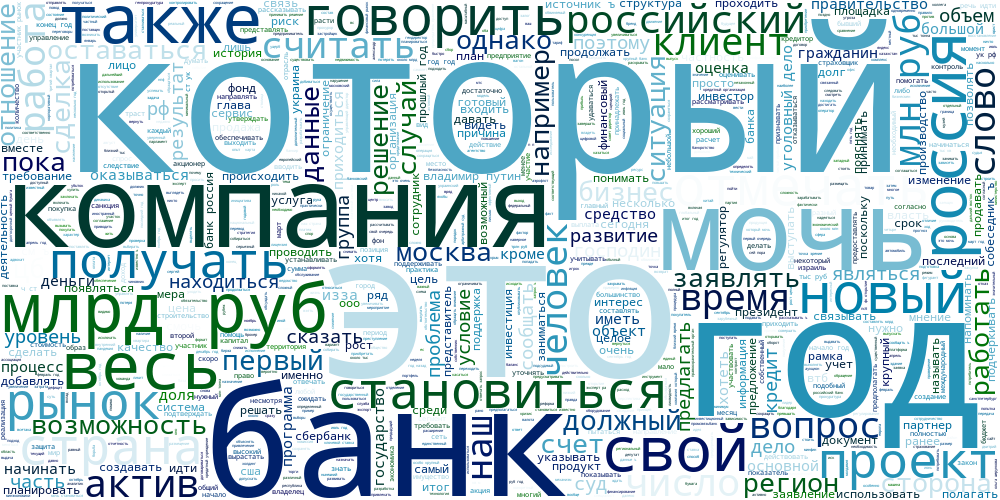

In [248]:
draw_cloud(a[a['clusters'] == 0]['paper_stemming_text'])

In [249]:
clusster_data[clusster_data['clusters'] == 0]['bank']

3            Александровский
4            Алмазэргиэнбанк
7                    БМ-Банк
10             Банк Авангард
11               Банк Акцепт
15            Банк Восточный
17              Банк Держава
18         Банк Екатеринбург
22               Банк Казани
23         Банк Левобережный
24            Банк Оранжевый
25             Банк Оренбург
28             Банк Приморье
30     Банк Развитие-Столица
31      Банк Санкт-Петербург
34         Банк Солидарность
35                 Банк Союз
39            Банк Финсервис
40               Банк Хлынов
41         Банк Центр-инвест
42       Бизнес-Сервис-Траст
45                  ВУЗ-банк
53         Интерпрогрессбанк
57          Кредит Урал Банк
59             Кубань Кредит
60            Кузнецкий банк
69            Москоммерцбанк
71                   НК Банк
72                   НС Банк
75               Норвик Банк
81             Промсвязьбанк
89     Русский Народный Банк
95          Сити Инвест Банк
98                Солид Банк
100           

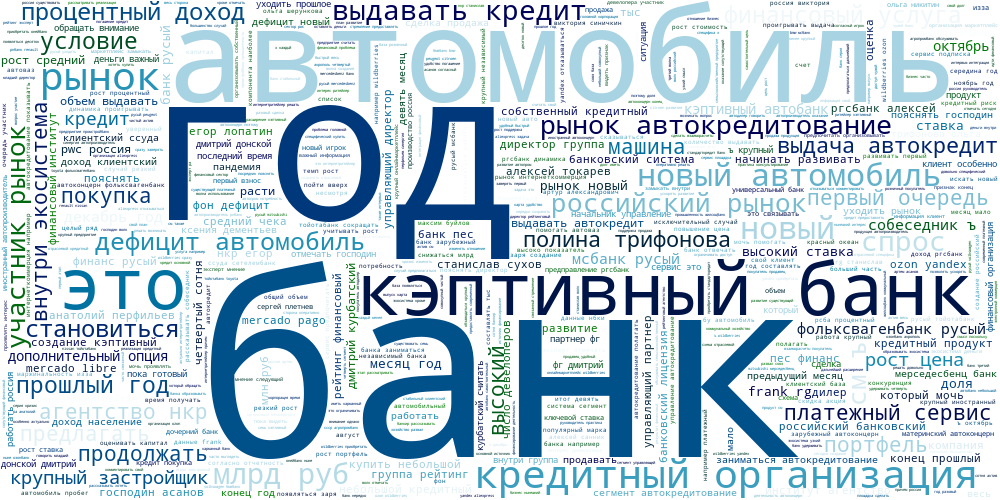

In [250]:
draw_cloud(a[a['clusters'] == 1]['paper_stemming_text'])

In [251]:
clusster_data[clusster_data['clusters'] == 1]['bank']

8                    БМВ Банк
65                МС Банк Рус
67     Мерседес-Бенц Банк РУС
102               Тойота Банк
106      Фольксваген Банк РУС
Name: bank, dtype: object

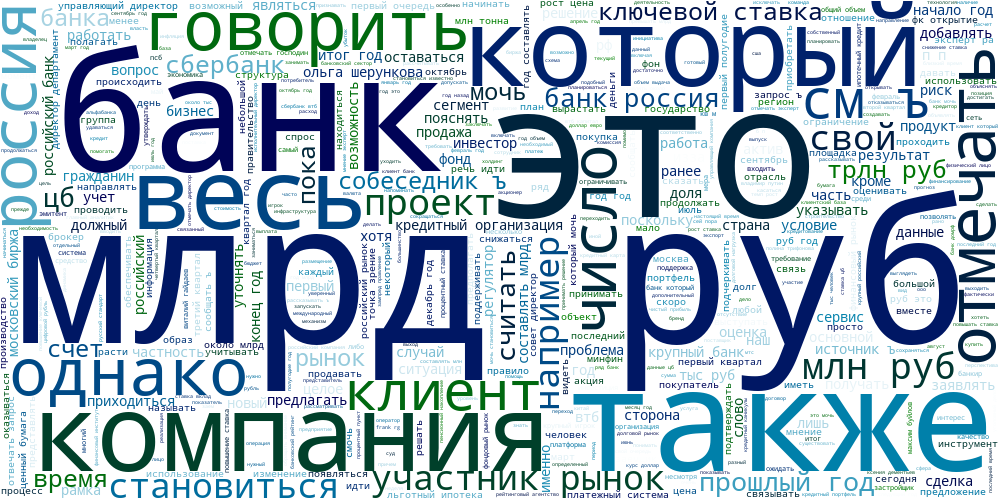

In [252]:
draw_cloud(a[a['clusters'] == 2]['paper_stemming_text'])

In [253]:
clusster_data[clusster_data['clusters'] == 2]['bank']

0                       Абсолют Банк
1        Азиатско-Тихоокеанский Банк
5                         Альфа-Банк
12                         Банк Барс
13                         Банк ВБРР
14                   Банк Вологжанин
16                       Банк ДОМ.РФ
19     Банк Жилищного Финансирования
20                        Банк Зенит
21                       Банк Интеза
26                     Банк Открытие
29                         Банк РНКБ
32                       Банк Синара
33                   Банк Снежинский
37                        Банк УБРиР
38                      Банк Уралсиб
43                        БыстроБанк
44                               ВТБ
47                       Газпромбанк
49                           Генбанк
50              Дальневосточный банк
51                        Икано Банк
54                 Квант Мобайл Банк
55                      Кошелев-Банк
56                Кредит Европа Банк
58                       Кросна-Банк
61                        Ланта-Банк
6

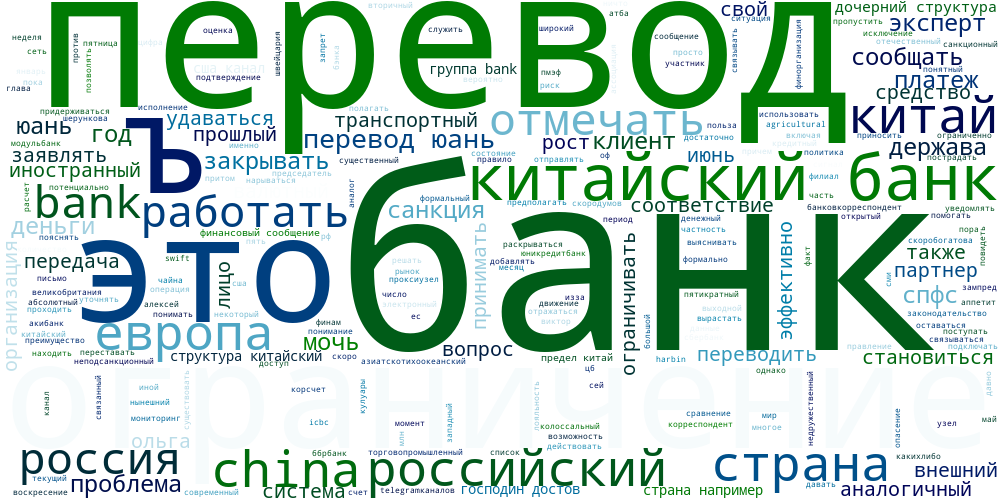

In [254]:
draw_cloud(a[a['clusters'] == 3]['paper_stemming_text'])

In [255]:
clusster_data[clusster_data['clusters'] == 3]['bank']

2     Акибанк
6    ББР Банк
Name: bank, dtype: object

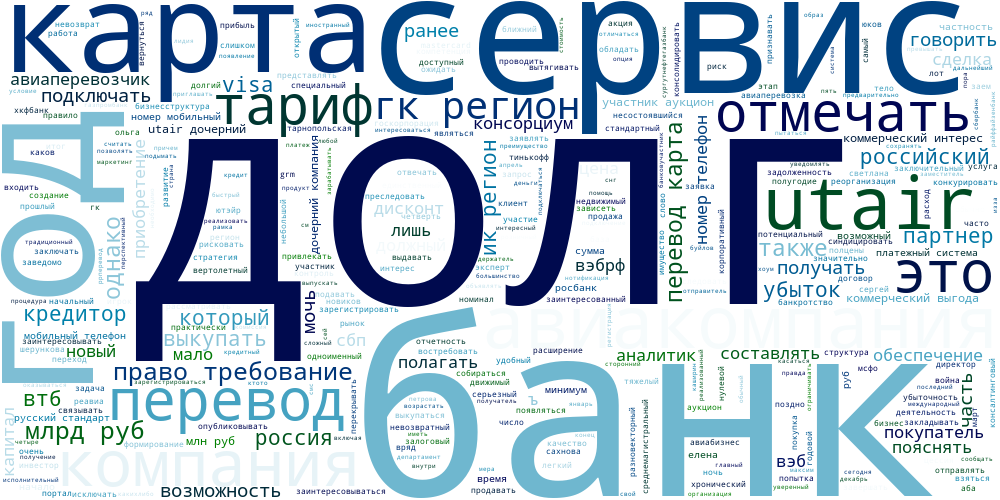

In [256]:
draw_cloud(a[a['clusters'] == 4]['paper_stemming_text'])

In [257]:
clusster_data[clusster_data['clusters'] == 4]['bank']

73             Нико-Банк
99    Сургутнефтегазбанк
Name: bank, dtype: object

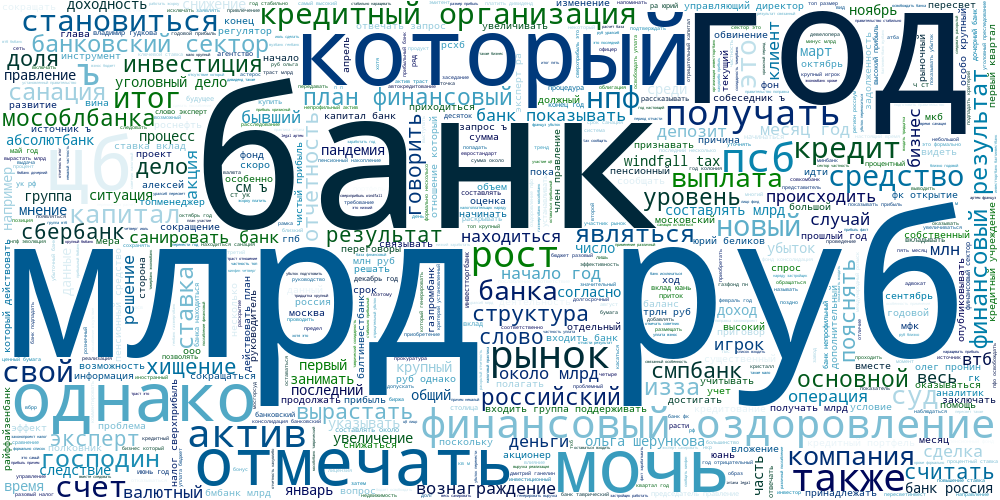

In [258]:
draw_cloud(a[a['clusters'] == 5]['paper_stemming_text'])

In [259]:
clusster_data[clusster_data['clusters'] == 5]['bank']

9       Балтинвестбанк
27       Банк Пересвет
36    Банк Таврический
46          Венец банк
48       Газэнергобанк
52      Инвестторгбанк
70          Мособлбанк
94        Севергазбанк
Name: bank, dtype: object

In [261]:
clusster_data.to_excel('tf_idf+spectral.xlsx')

Text(0.5, 1.0, 'Spectr')

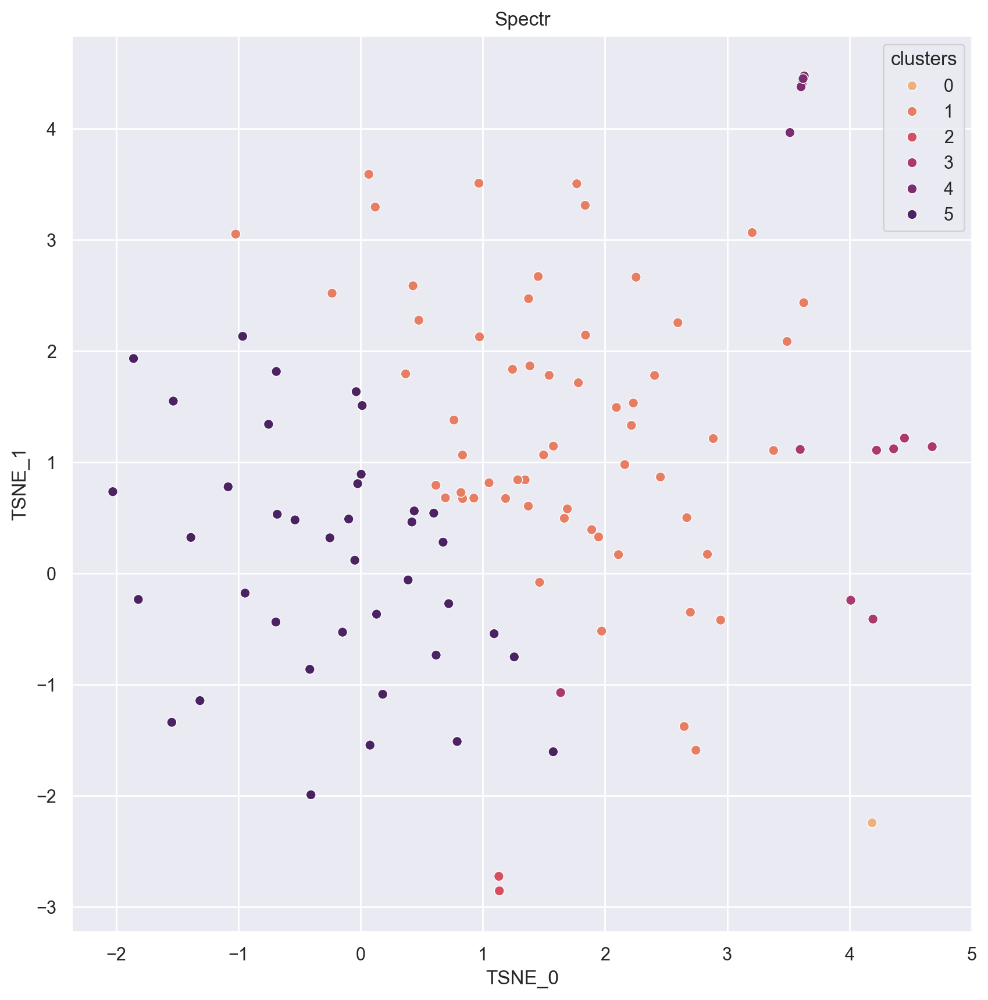

In [199]:
sns.set(rc={'figure.figsize':(10, 10)})
sns.scatterplot(data = clusster_data, x='TSNE_0', y='TSNE_1', hue=clusster_data['clusters'], palette=sns.color_palette("flare", as_cmap=True))
plt.title('Spectr')

#### Тематическое моделирование

In [222]:
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer

In [223]:
bag_stem = CountVectorizer(min_df=1)
bag_stem.fit(data['paper_stemming_text'])
macro_stem_bag = get_vectors('paper_stemming_text', bag_stem, 'macro')

In [224]:
data_ = pd.DataFrame({'bank':macro_stem_bag['bank']})

In [225]:
n = 4
lda_ = LatentDirichletAllocation(n_components=n, random_state=42)
topics = lda_.fit_transform(macro_stem_bag.iloc[:,1:])
labels = np.argmax(topics, axis=1)
data_[f'lda_label'] = labels

bank_cluster = {}
cols = ['bank']+[x for x in range(n)]
bank_embeding = pd.DataFrame(columns=cols)

banks = list(pd.unique(macro_stem_bag['bank']))
for i in banks:
    label = data_[data_['bank'] == i]['lda_label'].mode().iloc[0]
    bank_cluster[i] = label
    bank_idx = macro_stem_bag[macro_stem_bag['bank'] == i].index
    vec = pd.DataFrame(topics[bank_idx, :].mean(axis=0)).T
    vec.insert(0, "bank", [i])
    bank_embeding = pd.concat([bank_embeding, vec], axis=0)

/var/folders/0v/mjh6qpnj1jvg0mmzcsb5mz5r0000gn/T/ipykernel_79320/1535171757.py:18: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  bank_embeding = pd.concat([bank_embeding, vec], axis=0)


In [226]:
bank_embeding

,bank,0,1,2,3
0,Сбербанк,0.112906,0.207772,0.269092,0.410230
0,ВТБ,0.108248,0.311809,0.195521,0.384422
0,Альфа-Банк,0.093572,0.061234,0.279384,0.565810
0,Газпромбанк,0.063467,0.429500,0.151636,0.355397
0,Тинькофф Банк,0.072422,0.098271,0.464853,0.364454
...,...,...,...,...,...
0,Тольяттихимбанк,0.936879,0.056828,0.000700,0.005594
0,Кросна-Банк,0.000779,0.000778,0.088890,0.909553
0,Траст банк,0.260289,0.353788,0.085579,0.300344
0,Фридом Финанс,0.073039,0.161389,0.063817,0.701755


In [227]:
a = data[['paper_stemming_text']].copy()
a['lda_label'] = labels

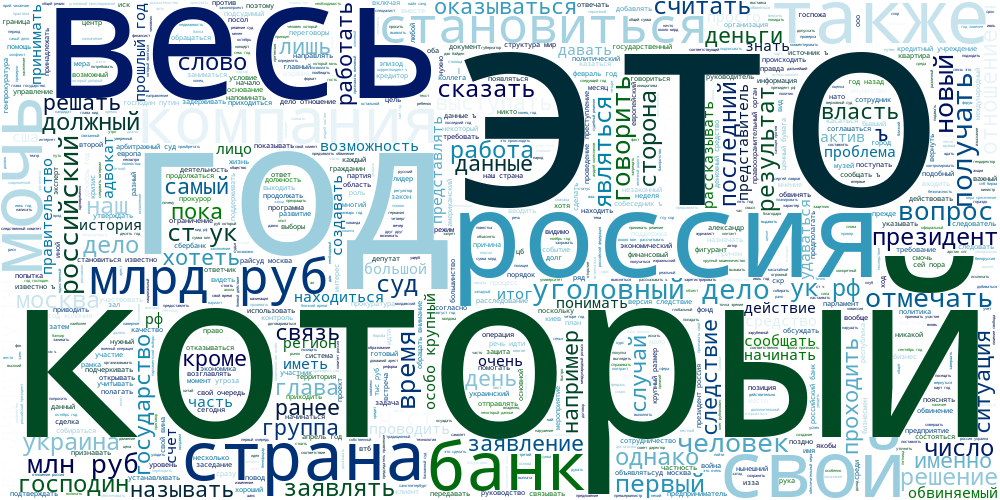

In [228]:
draw_cloud(a[a['lda_label'] == 0]['paper_stemming_text']) #проблемы с законом

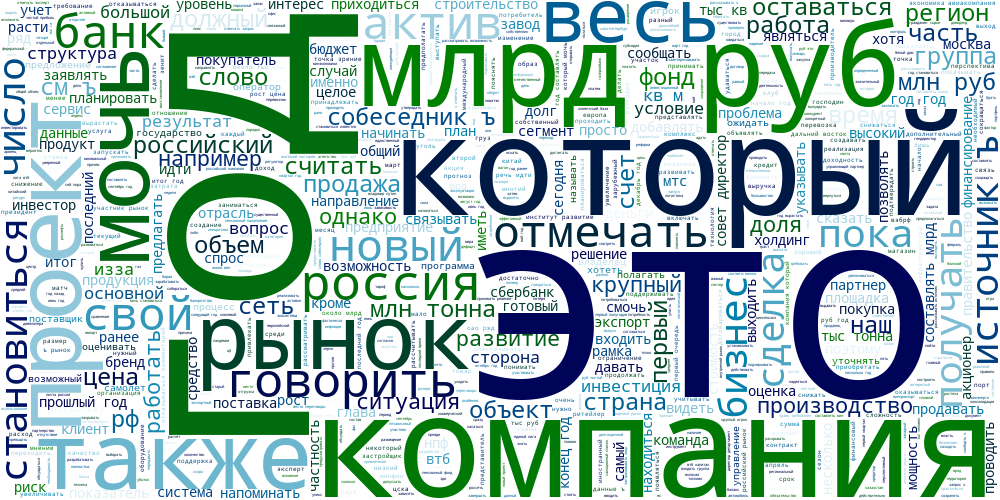

In [229]:
draw_cloud(a[a['lda_label'] == 1]['paper_stemming_text']) #расширение стратегий

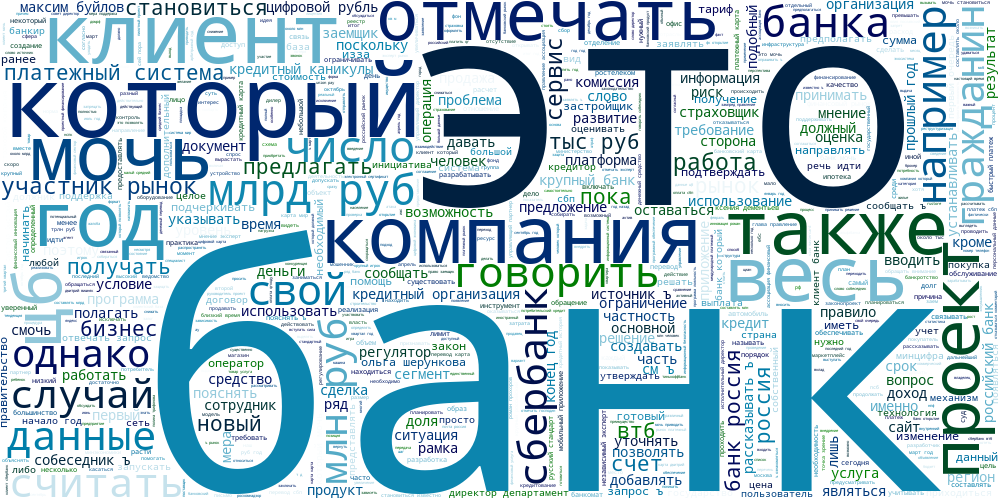

In [230]:
draw_cloud(a[a['lda_label'] == 2]['paper_stemming_text']) # государственность

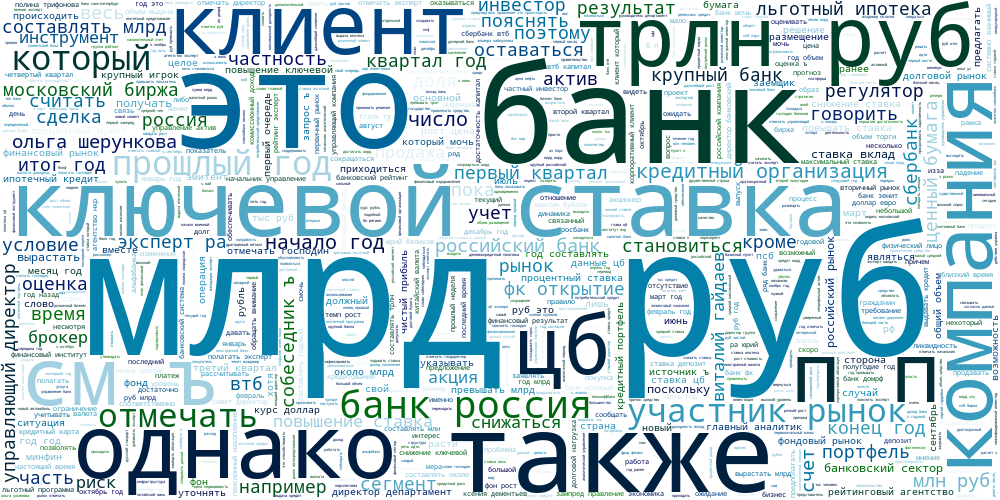

In [231]:
draw_cloud(a[a['lda_label'] == 3]['paper_stemming_text']) #инвестиции в бумаги

In [240]:
bank_embeding['lda_cluster'] = bank_embeding['bank'].map(bank_cluster)
bank_embeding = bank_embeding.rename(columns={0:'law', 1:'stratagy', 2:'nationhood', 3:'securities'})
bank_embeding.to_excel('lda_topics.xlsx')

### Карта банков + динамика кластеров

___